In [ ]:
import os
from zipfile import ZipFile
import pickle
import numpy as np
import cv2
import matplotlib.pyplot as plt
from matplotlib import patches
import pandas as pd
from imgaug import augmenters as iaa
import glob
import imageio
import re
from imgaug.augmentables.bbs import BoundingBoxesOnImage
import seaborn as sns

import click

import visualkeras

from collections import defaultdict

from sklearn.metrics import classification_report, precision_score, recall_score, f1_score, confusion_matrix

import tensorflow as tf
from keras import backend, Model, Input, activations
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, AveragePooling2D, BatchNormalization, MaxPool2D, ZeroPadding2D, Activation, Add, GlobalAveragePooling2D
from keras.losses import categorical_crossentropy, CategoricalCrossentropy
from keras.utils import np_utils, load_img, img_to_array
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from keras.optimizers import Adam
from keras.regularizers import l2
from keras.applications import MobileNetV2
from keras.applications.mobilenet_v2 import preprocess_input
from keras.preprocessing.image import ImageDataGenerator

from models.research.object_detection.utils import ops as utils_ops
from models.research.object_detection.utils import label_map_util
from models.research.object_detection.utils import visualization_utils as vis_util

import pathlib
from IPython.display import display
from PIL import Image

# patch tf1 into `utils.ops`
utils_ops.tensorflow = tf.compat.v1

# Patch the location of gfile
tf.gfile = tf.io.gfile


PATH_TO_LABELS = 'models/research/object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

from sklearn.preprocessing import LabelEncoder, LabelBinarizer
le=LabelEncoder()

lb=LabelBinarizer()

import warnings
warnings.filterwarnings("ignore")

plt.grid(None)
plt.axis('off')
random_state=42
%matplotlib inline

model_list=list()
# !git clone https://github.com/tensorflow/models

2023-06-22 13:19:13.462881: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [1]:
%%shell
jupyter nbconvert --to html Car_Detetction_New.ipynb

[NbConvertApp] Converting notebook Car_Detetction_New.ipynb to html
[NbConvertApp] Writing 15298633 bytes to Car_Detetction_New.html


# Milestone 1

## Step 1: Import the data.
## Step 2: Map training and testing images to its classes.
## Step 3: Map training and testing images to its annotations.

In [ ]:
ZipFile('Car Images.zip').extractall()
ZipFile('Annotations.zip').extractall()

In [ ]:
car_name_df = pd.read_csv('Car names and make.csv', names=['Car Name and Make'])
car_name_df.head()

,Car Name and Make
0,AM General Hummer SUV 2000
1,Acura RL Sedan 2012
2,Acura TL Sedan 2012
3,Acura TL Type-S 2008
4,Acura TSX Sedan 2012


In [ ]:
car_name_df.shape

(196, 1)

In [ ]:
annot_train_df = pd.read_csv('Annotations/Train Annotations.csv', header=0)
annot_train_df.columns=['Image_Name','x1','y1','x2','y2','Image_Class']
annot_train_df.head()

,Image_Name,x1,y1,x2,y2,Image_Class
0,00001.jpg,39,116,569,375,14
1,00002.jpg,36,116,868,587,3
2,00003.jpg,85,109,601,381,91
3,00004.jpg,621,393,1484,1096,134
4,00005.jpg,14,36,133,99,106


In [ ]:
annot_train_df.shape

(8144, 6)

In [ ]:
annot_test_df = pd.read_csv('Annotations/Test Annotation.csv', header=0)
annot_test_df.columns=['Image_Name','x1','y1','x2','y2','Image_Class']
annot_test_df.head()

,Image_Name,x1,y1,x2,y2,Image_Class
0,00001.jpg,30,52,246,147,181
1,00002.jpg,100,19,576,203,103
2,00003.jpg,51,105,968,659,145
3,00004.jpg,67,84,581,407,187
4,00005.jpg,140,151,593,339,185


In [ ]:
annot_test_df.shape

(8041, 6)

In [ ]:
# Train folder
train_dir = 'Car Images/Train Images'
training_images_list = []
for folder in os.listdir(train_dir):
    img_folder = os.path.join(train_dir, folder)
    if not os.path.isdir(img_folder):
        continue
    for img_file in os.listdir(img_folder):
        img_path = os.path.join(img_folder, img_file)
        training_images_list.append([img_file, img_path, folder, annot_train_df[annot_train_df['Image_Name'] == img_file]['Image_Class'].values[0]])

# Creating dataframe
training_car_images_df = pd.DataFrame(training_images_list,
                                      columns=['Image_Name', 'Image_Path', 'Class', 'Image_Class'])
training_car_images_df.head()

,Image_Name,Image_Path,Class,Image_Class
0,06796.jpg,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,90
1,04157.jpg,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,90
2,00682.jpg,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,90
3,07660.jpg,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,90
4,00483.jpg,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,90


In [ ]:
training_car_images_df.shape

(8144, 4)

In [ ]:
# Test folder
test_dir = 'Car Images/Test Images'
testing_images_list = []
for folder in os.listdir(test_dir):
    img_folder = os.path.join(test_dir, folder)
    if not os.path.isdir(img_folder):
        continue
    for img_file in os.listdir(img_folder):
        img_path = os.path.join(img_folder, img_file)
        testing_images_list.append([img_file, img_path, folder, annot_test_df[annot_test_df['Image_Name'] == img_file]['Image_Class'].values[0]])

# Creating dataframe
testing_car_images_df = pd.DataFrame(testing_images_list,
                                     columns=['Image_Name', 'Image_Path', 'Class', 'Image_Class'])
testing_car_images_df.head()

,Image_Name,Image_Path,Class,Image_Class
0,00318.jpg,Car Images/Test Images/Dodge Dakota Crew Cab 2...,Dodge Dakota Crew Cab 2010,90
1,03773.jpg,Car Images/Test Images/Dodge Dakota Crew Cab 2...,Dodge Dakota Crew Cab 2010,90
2,01206.jpg,Car Images/Test Images/Dodge Dakota Crew Cab 2...,Dodge Dakota Crew Cab 2010,90
3,08018.jpg,Car Images/Test Images/Dodge Dakota Crew Cab 2...,Dodge Dakota Crew Cab 2010,90
4,05448.jpg,Car Images/Test Images/Dodge Dakota Crew Cab 2...,Dodge Dakota Crew Cab 2010,90


In [ ]:
testing_car_images_df.shape

(8041, 4)

In [ ]:
annot_train_car_images_df=pd.merge(training_car_images_df, annot_train_df[['Image_Name','x1','y1','x2','y2']], on='Image_Name')
annot_train_car_images_df.head()

,Image_Name,Image_Path,Class,Image_Class,x1,y1,x2,y2
0,06796.jpg,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,90,57,88,361,293
1,04157.jpg,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,90,10,20,256,171
2,00682.jpg,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,90,11,15,297,201
3,07660.jpg,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,90,68,122,980,690
4,00483.jpg,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,90,18,26,623,342


In [ ]:
annot_train_car_images_df.shape

(8144, 8)

In [ ]:
annot_test_car_images_df=pd.merge(testing_car_images_df, annot_test_df[['Image_Name','x1','y1','x2','y2']], on='Image_Name')
annot_test_car_images_df.head()

,Image_Name,Image_Path,Class,Image_Class,x1,y1,x2,y2
0,00318.jpg,Car Images/Test Images/Dodge Dakota Crew Cab 2...,Dodge Dakota Crew Cab 2010,90,83,55,465,324
1,03773.jpg,Car Images/Test Images/Dodge Dakota Crew Cab 2...,Dodge Dakota Crew Cab 2010,90,33,43,240,168
2,01206.jpg,Car Images/Test Images/Dodge Dakota Crew Cab 2...,Dodge Dakota Crew Cab 2010,90,9,60,294,183
3,08018.jpg,Car Images/Test Images/Dodge Dakota Crew Cab 2...,Dodge Dakota Crew Cab 2010,90,16,185,1011,652
4,05448.jpg,Car Images/Test Images/Dodge Dakota Crew Cab 2...,Dodge Dakota Crew Cab 2010,90,2,43,278,186


In [ ]:
annot_test_car_images_df.shape

(8041, 8)

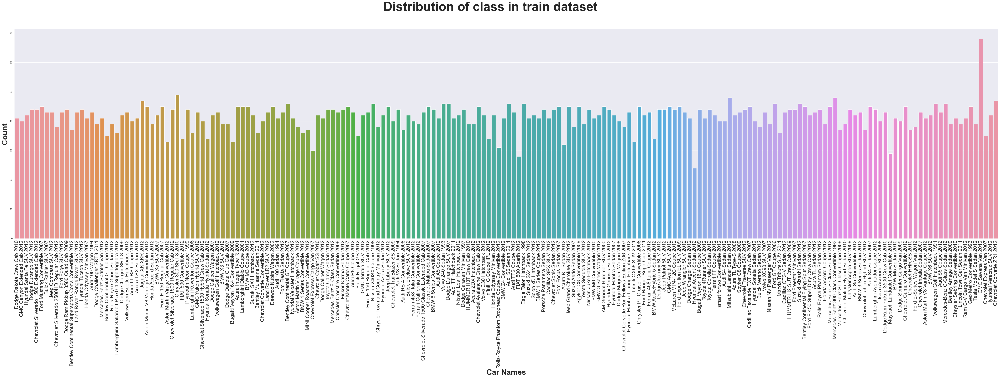

In [ ]:
# Distribution of class in train dataset
plt.figure(figsize=(70,15))
sns.countplot(data=annot_train_car_images_df,x='Class')
plt.xticks(rotation=90, fontsize=20)
plt.suptitle('Distribution of class in train dataset', fontsize=50,fontweight='bold')
plt.ylabel('Count', fontsize=30,fontweight='bold')
plt.xlabel('Car Names', fontsize=30,fontweight='bold')
plt.show()

In [ ]:
annot_train_car_images_df['Class'].value_counts(ascending=False, normalize=True).mul(100).round(2).astype(str) + '%'

GMC Savana Van 2012                                    0.83%
Chrysler 300 SRT-8 2010                                 0.6%
Mercedes-Benz 300-Class Convertible 1993               0.59%
Mitsubishi Lancer Sedan 2012                           0.59%
Chevrolet Corvette ZR1 2012                            0.58%
                                                       ...  
Rolls-Royce Phantom Drophead Coupe Convertible 2012    0.38%
Chevrolet Express Cargo Van 2007                       0.37%
Maybach Landaulet Convertible 2012                     0.36%
FIAT 500 Abarth 2012                                   0.34%
Hyundai Accent Sedan 2012                              0.29%
Name: Class, Length: 196, dtype: object

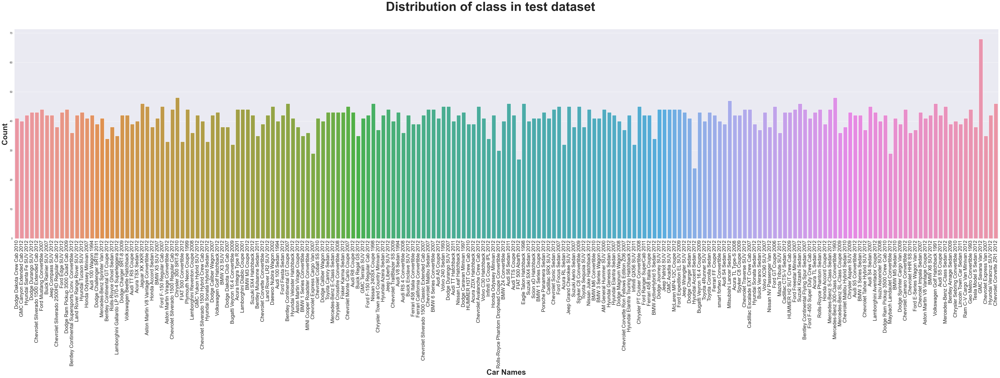

In [ ]:
# Distribution of class in test dataset
plt.figure(figsize=(70,15))
sns.countplot(data=annot_test_car_images_df,x='Class')
plt.xticks(rotation=90, fontsize=20)
plt.suptitle('Distribution of class in test dataset', fontsize=50,fontweight='bold')
plt.ylabel('Count', fontsize=30,fontweight='bold')
plt.xlabel('Car Names', fontsize=30,fontweight='bold')
plt.show()

In [ ]:
annot_test_car_images_df['Class'].value_counts(ascending=False, normalize=True).mul(100).round(2).astype(str) + '%'

GMC Savana Van 2012                                    0.85%
Mercedes-Benz 300-Class Convertible 1993                0.6%
Chrysler 300 SRT-8 2010                                 0.6%
Mitsubishi Lancer Sedan 2012                           0.58%
Audi S6 Sedan 2011                                     0.57%
                                                       ...  
Rolls-Royce Phantom Drophead Coupe Convertible 2012    0.37%
Chevrolet Express Cargo Van 2007                       0.36%
Maybach Landaulet Convertible 2012                     0.36%
FIAT 500 Abarth 2012                                   0.34%
Hyundai Accent Sedan 2012                               0.3%
Name: Class, Length: 196, dtype: object

Data pre-processing

In [ ]:
annot_train_car_images_df_copy=annot_train_car_images_df.copy(deep=True)
annot_train_car_images_df_copy.head()

,Image_Name,Image_Path,Class,Image_Class,x1,y1,x2,y2
0,06796.jpg,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,90,57,88,361,293
1,04157.jpg,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,90,10,20,256,171
2,00682.jpg,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,90,11,15,297,201
3,07660.jpg,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,90,68,122,980,690
4,00483.jpg,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,90,18,26,623,342


In [ ]:
# Train crop folder
train_dir_crop = 'Car Images/Train Images Cropped'
margin=15
for idx,row in annot_train_car_images_df.iterrows():
    dst_path = os.path.join(train_dir_crop, row['Class'])
    if not os.path.exists(dst_path):
        os.makedirs(dst_path)

    car_img_name=row['Image_Path'].split('/')[-1]
    dst_path = os.path.join(dst_path, car_img_name)

    img = cv2.imread(row['Image_Path'])

    height, width = img.shape[:2]

    x1 = max(0, row['x1'] - margin)
    y1 = max(0, row['y1'] - margin)
    x2 = min(row['x2'] + margin, width)
    y2 = min(row['y2'] + margin, height)

    crop_image = img[y1:y2, x1:x2]
    cv2.imwrite(dst_path, crop_image)

    annot_train_car_images_df.loc[idx,['Image_Path']]=dst_path

In [ ]:
annot_train_car_images_df.head()

,Image_Name,Image_Path,Class,Image_Class,x1,y1,x2,y2
0,06796.jpg,Car Images/Train Images Cropped/Dodge Dakota C...,Dodge Dakota Crew Cab 2010,90,57,88,361,293
1,04157.jpg,Car Images/Train Images Cropped/Dodge Dakota C...,Dodge Dakota Crew Cab 2010,90,10,20,256,171
2,00682.jpg,Car Images/Train Images Cropped/Dodge Dakota C...,Dodge Dakota Crew Cab 2010,90,11,15,297,201
3,07660.jpg,Car Images/Train Images Cropped/Dodge Dakota C...,Dodge Dakota Crew Cab 2010,90,68,122,980,690
4,00483.jpg,Car Images/Train Images Cropped/Dodge Dakota C...,Dodge Dakota Crew Cab 2010,90,18,26,623,342


In [ ]:
annot_test_car_images_df_copy=annot_test_car_images_df.copy(deep=True)
annot_test_car_images_df.head()

,Image_Name,Image_Path,Class,Image_Class,x1,y1,x2,y2
0,00318.jpg,Car Images/Test Images/Dodge Dakota Crew Cab 2...,Dodge Dakota Crew Cab 2010,90,83,55,465,324
1,03773.jpg,Car Images/Test Images/Dodge Dakota Crew Cab 2...,Dodge Dakota Crew Cab 2010,90,33,43,240,168
2,01206.jpg,Car Images/Test Images/Dodge Dakota Crew Cab 2...,Dodge Dakota Crew Cab 2010,90,9,60,294,183
3,08018.jpg,Car Images/Test Images/Dodge Dakota Crew Cab 2...,Dodge Dakota Crew Cab 2010,90,16,185,1011,652
4,05448.jpg,Car Images/Test Images/Dodge Dakota Crew Cab 2...,Dodge Dakota Crew Cab 2010,90,2,43,278,186


In [ ]:
# Test crop folder
test_dir_crop = 'Car Images/Test Images Cropped'
margin=15
for idx,row in annot_test_car_images_df.iterrows():
    dst_path = os.path.join(test_dir_crop, row['Class'])
    if not os.path.exists(dst_path):
        os.makedirs(dst_path)

    car_img_name=row['Image_Path'].split('/')[-1]
    dst_path = os.path.join(dst_path, car_img_name)

    img = cv2.imread(row['Image_Path'])

    height, width = img.shape[:2]

    x1 = max(0, row['x1'] - margin)
    y1 = max(0, row['y1'] - margin)
    x2 = min(row['x2'] + margin, width)
    y2 = min(row['y2'] + margin, height)

    crop_image = img[y1:y2, x1:x2]
    cv2.imwrite(dst_path, crop_image)

    annot_test_car_images_df.loc[idx,['Image_Path']]=dst_path

In [ ]:
annot_test_car_images_df.head()

,Image_Name,Image_Path,Class,Image_Class,x1,y1,x2,y2
0,00318.jpg,Car Images/Test Images Cropped/Dodge Dakota Cr...,Dodge Dakota Crew Cab 2010,90,83,55,465,324
1,03773.jpg,Car Images/Test Images Cropped/Dodge Dakota Cr...,Dodge Dakota Crew Cab 2010,90,33,43,240,168
2,01206.jpg,Car Images/Test Images Cropped/Dodge Dakota Cr...,Dodge Dakota Crew Cab 2010,90,9,60,294,183
3,08018.jpg,Car Images/Test Images Cropped/Dodge Dakota Cr...,Dodge Dakota Crew Cab 2010,90,16,185,1011,652
4,05448.jpg,Car Images/Test Images Cropped/Dodge Dakota Cr...,Dodge Dakota Crew Cab 2010,90,2,43,278,186


## Step 4: Display images with bounding box.

In [ ]:
test_bounding_df=annot_test_car_images_df_copy.groupby('Image_Class').apply(lambda x:  x.sample(1)).reset_index(drop=True)
test_bounding_df.shape

(196, 8)

                    Test Dataset bounding box                    


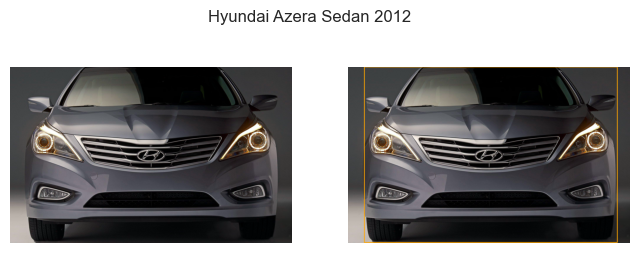

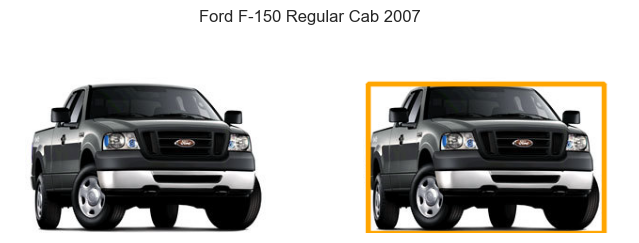

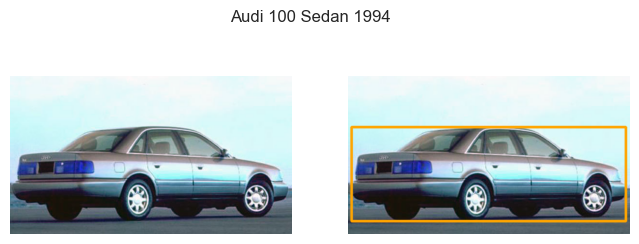

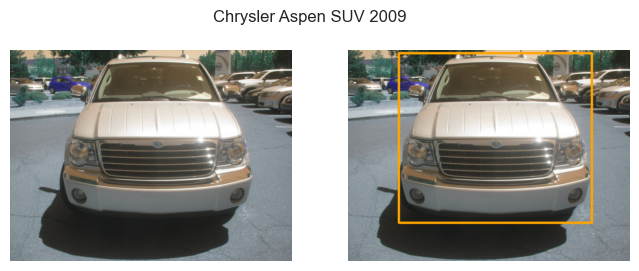

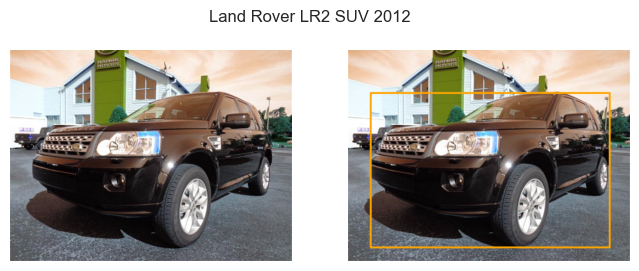

In [ ]:
click.secho("Test Dataset bounding box".center(65), fg="blue", bold=True, italic=True)
for idx,row in test_bounding_df.sample(n=5,random_state=random_state).iterrows():
    plt.figure(figsize=(8,3))
    plt.suptitle(row['Class'])

    img = cv2.imread(row['Image_Path'])

    plt.subplot(121),plt.imshow(img),plt.axis('off')

    cv2.rectangle(img, (row['x1'], row['y1']), (row['x2'], row['y2']), (255, 165, 0), 4, cv2.LINE_AA)

    plt.subplot(122),plt.imshow(img),plt.axis('off')

In [ ]:
train_bounding_df=annot_train_car_images_df_copy.groupby('Image_Class').apply(lambda x:  x.sample(1)).reset_index(drop=True)
train_bounding_df.shape

(196, 8)

                    Train Dataset bounding box                   


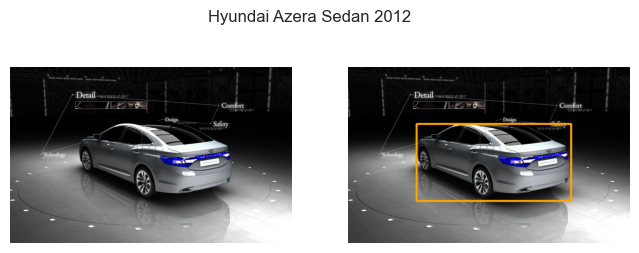

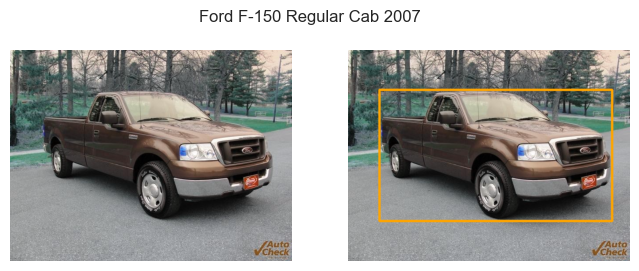

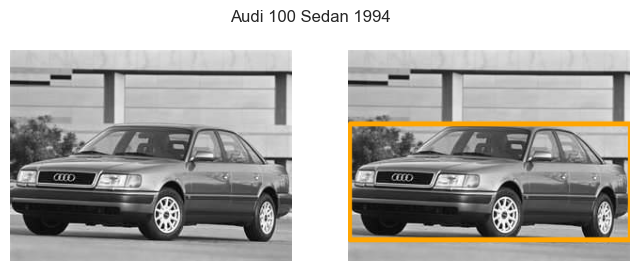

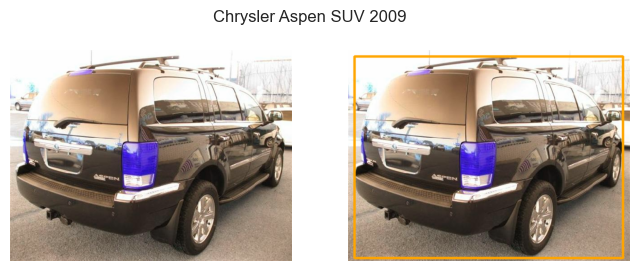

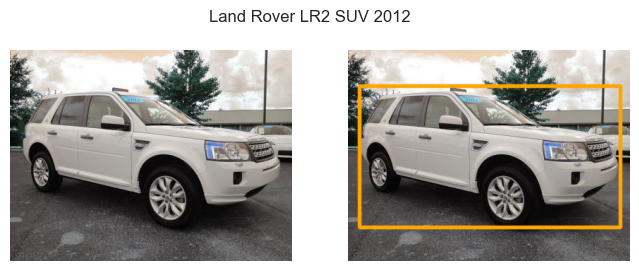

In [ ]:
click.secho("Train Dataset bounding box".center(65), fg="blue", bold=True, italic=True)
for idx,row in train_bounding_df.sample(n=5,random_state=random_state).iterrows():
    plt.figure(figsize=(8,3))
    plt.suptitle(row['Class'])

    img = cv2.imread(row['Image_Path'])

    plt.subplot(121),plt.imshow(img),plt.axis('off')

    cv2.rectangle(img, (row['x1'], row['y1']), (row['x2'], row['y2']), (255, 165, 0), 4, cv2.LINE_AA)

    plt.subplot(122),plt.imshow(img),plt.axis('off')

## Step 5: Design, train and test basic CNN models to classify the car.

In [ ]:
def convert(img_name, car_image_list):
    # Converting image to array
    cv_img=cv2.imread(img_name)

    # Unifying all images to same height and width and then normalizing pixels
    car_image_list.append(cv2.resize(cv_img, (224,224), interpolation = cv2.INTER_AREA).astype('float32')/255.0)

In [ ]:
def visualkeras_view(model):
    color_map = defaultdict(dict)

    color_map[Conv2D]['fill'] = '#00f5d4'
    color_map[MaxPooling2D]['fill'] = '#8338ec'
    color_map[Dropout]['fill'] = '#03045e'
    color_map[Dense]['fill'] = '#fb5607'
    color_map[Flatten]['fill'] = '#ffbe0b'

    return visualkeras.layered_view(model,legend=True,color_map=color_map,max_xy=500, min_xy=10, min_z=10,spacing=20,max_z=500, scale_xy=0.5)

In [ ]:
def create_callbacks(model):
    checkpoint=ModelCheckpoint(model+"_weights.h5",monitor='val_accuracy',
                            save_weights_only=True, mode='max',verbose=1)
    early_stop = EarlyStopping(patience=8, min_delta=1e-4, monitor='val_loss')
    reduce_lr=ReduceLROnPlateau(monitor='val_loss',factor=0.1,patience=4,min_lr=1e-4)

    return [checkpoint,reduce_lr,early_stop]

In [ ]:
def metric_score(model_history, model, batch_size, model_name, model_lists, is_image_augmented=False, train_set=None, test_set=None):

    # Capturing learning history per epoch
    model_hist  = pd.DataFrame(model_history.history)
    model_hist['epoch'] = model_history.epoch

    # Plotting Loss at different epochs
    plt.title('Training Loss vs Validation Loss',fontsize=15,color="green")
    plt.plot(model_hist['loss'])
    plt.plot(model_hist['val_loss'])
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(("training" , "validation") , loc ='best')
    plt.show()

    # Plotting Accuracy at different epochs
    plt.title('Training Accuracy vs Validation Accuracy',fontsize=15,color="green")
    plt.plot(model_hist['accuracy'])
    plt.plot(model_hist['val_accuracy'])
    plt.ylabel('accuracy')
    plt.xlabel('Epoch')
    plt.legend(("training" , "validation") , loc ='best')
    plt.show()

    # calculate score of training data
    train_score = model.evaluate_generator(train_set, verbose=1) if is_image_augmented else model.evaluate(X_train, y_train, batch_size=batch_size, verbose=1)

    # calculate score of testing data
    test_score = model.evaluate_generator(test_set, verbose=1) if is_image_augmented else model.evaluate(X_test, y_test, batch_size=batch_size, verbose=1)

    # Predicting for X_test
    y_pred=np.argmax(model.predict_generator(test_generator, verbose=1) if is_image_augmented else model.predict_g(X_test, verbose=1), axis = 1)

    if not is_image_augmented:
        y_check_test = np.argmax(y_test, axis = 1)

    print("\nClassification Matrix:\n",classification_report(test_generator.classes, y_pred) if is_image_augmented else classification_report(y_check_test,y_pred))

    plt.figure(figsize = (30, 30))
    sns.heatmap(confusion_matrix(test_generator.classes, y_pred) if is_image_augmented else confusion_matrix(y_check_test,y_pred), annot = True,  fmt = '.1f')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

    if is_image_augmented:
        model_lists.append([model_name, train_score[0], test_score[0], train_score[1], test_score[1], precision_score(test_generator.classes,y_pred, average='micro'), recall_score(test_generator.classes,y_pred, average='micro'), f1_score(test_generator.classes,y_pred, average='micro')])
    else:
        model_lists.append([model_name, train_score[0], test_score[0], train_score[1], test_score[1], precision_score(y_check_test,y_pred, average='micro'), recall_score(y_check_test,y_pred, average='micro'), f1_score(y_check_test,y_pred, average='micro')])

### Creating X,y for train dataset

In [ ]:
# Formatting i/ps for X and normalizing pixels
annot_train_car_images_list=[]

annot_train_car_images_df['Image_Path'].apply(lambda x: convert(x,annot_train_car_images_list))
X_train=np.array(annot_train_car_images_list)

In [ ]:
# Encoding labels of the images
y_train=annot_train_car_images_df['Image_Class']
y_train=le.fit_transform(y_train)
y_train=np_utils.to_categorical(y_train)

In [ ]:
# X_train and y_train dataframe has been created for further analysis
X_train.shape, y_train.shape

((8144, 224, 224, 3), (8144, 196))

### Creating X,y for test dataset

In [ ]:
# Formatting i/ps for X and normalizing pixels
annot_test_car_images_list=[]

annot_test_car_images_df['Image_Path'].apply(lambda x: convert(x,annot_test_car_images_list))
X_test=np.array(annot_test_car_images_list)

In [ ]:
# Encoding labels of the images
y_test=annot_test_car_images_df['Image_Class']
y_test=le.fit_transform(y_test)
y_test=np_utils.to_categorical(y_test)

In [ ]:
# X_test and y_test dataframe has been created for further analysis
X_test.shape, y_test.shape

((8041, 224, 224, 3), (8041, 196))

In [ ]:
# create an iterator object with write permission - base_model_1.pkl
with open('X_train.pkl', 'wb') as files:
    pickle.dump(X_train, files)
with open('y_train.pkl', 'wb') as files:
    pickle.dump(y_train, files)
with open('X_test.pkl', 'wb') as files:
    pickle.dump(X_test, files)
with open('y_test.pkl', 'wb') as files:
    pickle.dump(y_test, files)

In [ ]:
with open('X_train.pkl' , 'rb') as f:
    X_train = pickle.load(f)
with open('y_train.pkl' , 'rb') as f:
    y_train = pickle.load(f)
with open('X_test.pkl' , 'rb') as f:
    X_test = pickle.load(f)
with open('y_test.pkl' , 'rb') as f:
    y_test = pickle.load(f)

### Model training

#### Initializing basic CNN with Architecture as : 3 Conv + 2 Avg pooling + 1 FC layer + 1 FC-softmax layer

In [ ]:
backend.clear_session()
tf.random.set_seed(random_state)

# Initialising CNN classifier
base_model_1=Sequential()

# Add a Convolution layer with 6 kernels of 5X5 shape with activation function ReLU
base_model_1.add(Conv2D(filters=6,kernel_size=(5,5),input_shape=(224,224,3),activation='relu'))
base_model_1.add(AveragePooling2D())

# Add another Convolution layer with 16 kernels of 5X5 shape with activation function ReLU
base_model_1.add(Conv2D(filters=16,kernel_size=(5,5),activation='relu'))
base_model_1.add(AveragePooling2D())

# Add another Convolution layer with 120 kernels of 5X5 shape with activation function ReLU
base_model_1.add(Conv2D(filters=120,kernel_size=(5,5),activation='relu'))

# Flattening the layer before fully connected layers
base_model_1.add(Flatten())

# Adding a fully connected layer with 512 neurons
base_model_1.add(Dense(units=84,activation='relu'))

# The final output layer with 5 neuron to predict the categorical classification
base_model_1.add(Dense(units=196,activation='softmax'))

adam = Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.001, amsgrad=False)
base_model_1.compile(optimizer = adam, loss = categorical_crossentropy, metrics = ['accuracy'])

2023-06-02 00:55:43.767961: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [ ]:
## Looking into our base model
base_model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 220, 220, 6)       456       
                                                                 
 average_pooling2d (AverageP  (None, 110, 110, 6)      0         
 ooling2D)                                                       
                                                                 
 conv2d_1 (Conv2D)           (None, 106, 106, 16)      2416      
                                                                 
 average_pooling2d_1 (Averag  (None, 53, 53, 16)       0         
 ePooling2D)                                                     
                                                                 
 conv2d_2 (Conv2D)           (None, 49, 49, 120)       48120     
                                                                 
 flatten (Flatten)           (None, 288120)            0

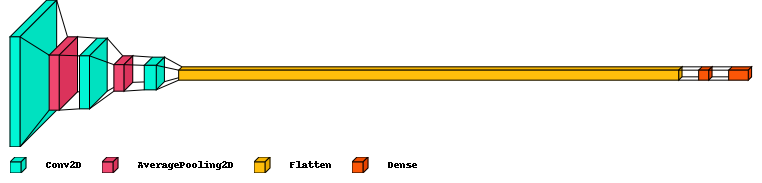

In [ ]:
visualkeras_view(base_model_1)

In [ ]:
# Fit the model
base_model_1_history=base_model_1.fit(X_train, y_train, validation_data=(X_test, y_test) , epochs=20, batch_size=50, verbose=1, callbacks=create_callbacks('base_model_1'))

Epoch 1/20
163/163 [==============================] - ETA: 0s - loss: 5.3743 - accuracy: 0.0079
Epoch 1: saving model to base_model_1_weights.h5
163/163 [==============================] - 309s 2s/step - loss: 5.3743 - accuracy: 0.0079 - val_loss: 5.2772 - val_accuracy: 0.0085 - lr: 0.0010
Epoch 2/20
163/163 [==============================] - ETA: 0s - loss: 5.2769 - accuracy: 0.0080
Epoch 2: saving model to base_model_1_weights.h5
163/163 [==============================] - 275s 2s/step - loss: 5.2769 - accuracy: 0.0080 - val_loss: 5.2700 - val_accuracy: 0.0078 - lr: 0.0010
Epoch 3/20
163/163 [==============================] - ETA: 0s - loss: 5.1768 - accuracy: 0.0198
Epoch 3: saving model to base_model_1_weights.h5
163/163 [==============================] - 228s 1s/step - loss: 5.1768 - accuracy: 0.0198 - val_loss: 5.1590 - val_accuracy: 0.0178 - lr: 0.0010
Epoch 4/20
163/163 [==============================] - ETA: 0s - loss: 4.4569 - accuracy: 0.0977
Epoch 4: saving model to base_mode

In [ ]:
# create an iterator object with write permission - base_model_1.pkl
with open('base_model_1.pkl', 'wb') as files:
    pickle.dump(base_model_1, files)

Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers
......average_pooling2d
.........vars
......average_pooling2d_1
.........vars
......conv2d
.........vars
............0
............1
......conv2d_1
.........vars
............0
............1
......conv2d_2
.........vars
............0
............1
......dense
.........vars
............0
............1
......dense_1
.........vars
............0
............1
......flatten
.........vars
...metrics
......mean
.........vars
............0
............1
......mean_metric_wrapper
.........vars
............0
............1
...vars
Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-06-02 01:36:24         4029
metadata.json                                  2023-06-02 01:36:24           64
variables.h5                                   2023-06-02 01:36:25     97107328


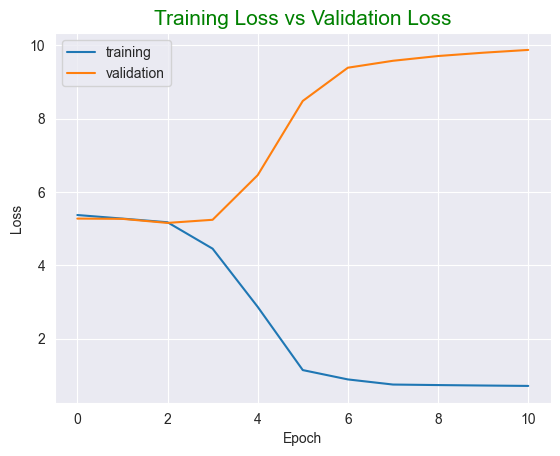

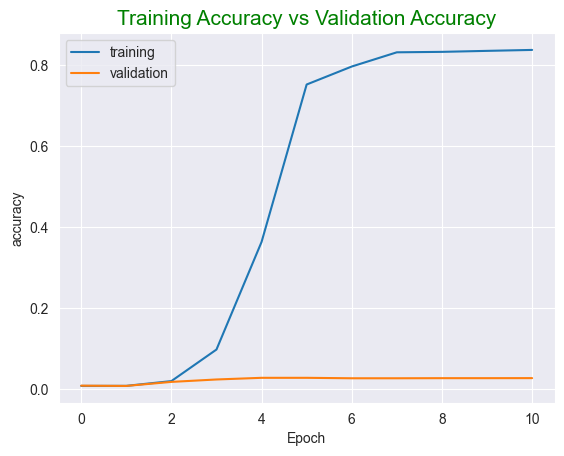

252/252 [==============================] - 41s 159ms/step

Classification Matrix:
               precision    recall  f1-score   support

           0       0.03      0.05      0.04        44
           1       0.00      0.00      0.00        32
           2       0.00      0.00      0.00        43
           3       0.00      0.00      0.00        42
           4       0.00      0.00      0.00        40
           5       0.04      0.05      0.04        44
           6       0.04      0.03      0.03        39
           7       0.00      0.00      0.00        45
           8       0.00      0.00      0.00        41
           9       0.00      0.00      0.00        33
          10       0.00      0.00      0.00        38
          11       0.00      0.00      0.00        36
          12       0.03      0.05      0.04        41
          13       0.02      0.02      0.02        42
          14       0.00      0.00      0.00        43
          15       0.04      0.02      0.03        4

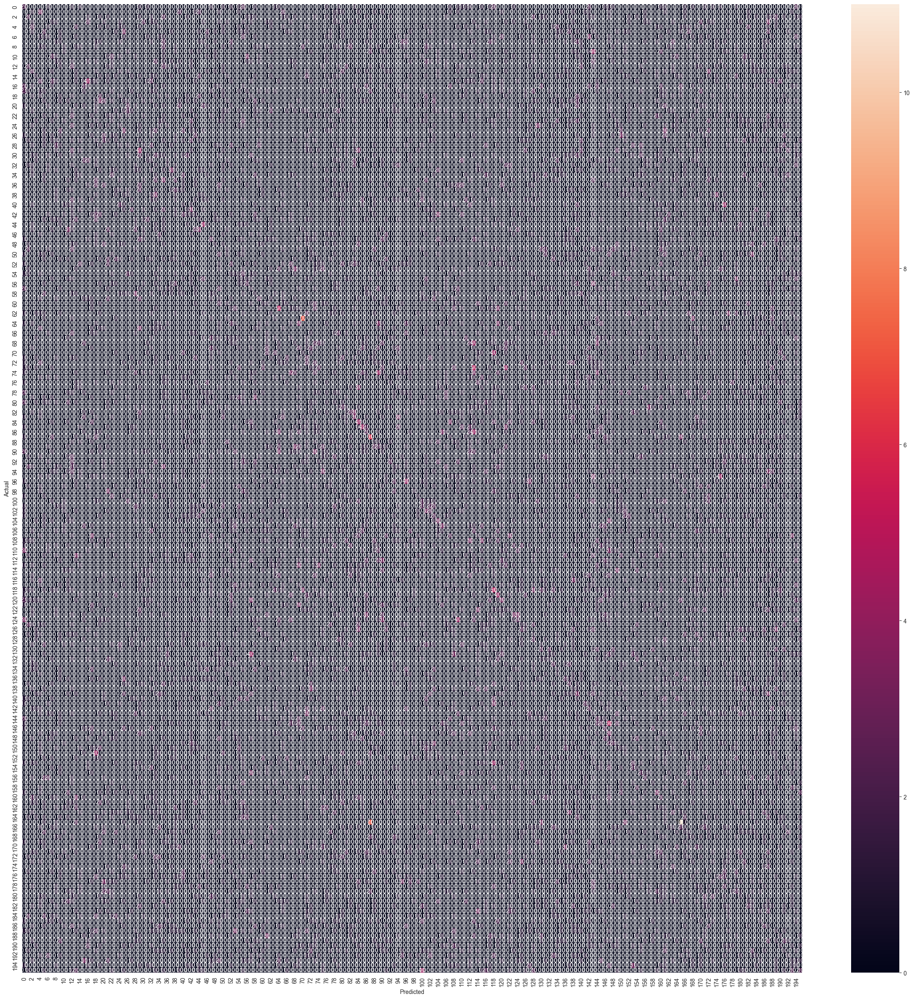

In [ ]:
metric_score(base_model_1_history,base_model_1,50,'base_model_1',model_list)

#### Initializing basic CNN with Architecture as : 5 Conv + 3 Max Pool + 2 FC layers + 1 FC-softmax layer

In [ ]:
backend.clear_session()
tf.random.set_seed(random_state)

# Initialising CNN classifier
base_model_2=Sequential()

# Add a Convolution layer with 96 kernels of 11X11 shape with activation function ReLU
base_model_2.add(Conv2D(filters=96,kernel_size=(11,11),strides=(4,4),input_shape=(224,224,3),activation='relu'))
base_model_2.add(BatchNormalization())
base_model_2.add(MaxPool2D(pool_size=(3,3), strides=(2,2)))

# Add another Convolution layer with 256 kernels of 5X5 shape with activation function ReLU
base_model_2.add(Conv2D(filters=256,kernel_size=(5,5),strides=(1,1),activation='relu',padding="same"))
base_model_2.add(BatchNormalization())
base_model_2.add(MaxPool2D(pool_size=(3,3), strides=(2,2)))

# Add another Convolution layer with 384 kernels of 3X3 shape with activation function ReLU
base_model_2.add(Conv2D(filters=384,kernel_size=(3,3),strides=(1,1),activation='relu',padding="same"))
base_model_2.add(BatchNormalization())

# Add another Convolution layer with 384 kernels of 3X3 shape with activation function ReLU
base_model_2.add(Conv2D(filters=384,kernel_size=(3,3),strides=(1,1),activation='relu',padding="same"))
base_model_2.add(BatchNormalization())

# Add another Convolution layer with 256 kernels of 3X3 shape with activation function ReLU
base_model_2.add(Conv2D(filters=256,kernel_size=(3,3),strides=(1,1),activation='relu',padding="same"))
base_model_2.add(BatchNormalization())
base_model_2.add(MaxPool2D(pool_size=(3,3), strides=(2,2)))

# Flattening the layer before fully connected layers
base_model_2.add(Flatten())

# Adding a fully connected layer with 4096 neurons
base_model_2.add(Dense(units=4096,activation='relu'))
base_model_2.add(Dropout(0.5))

# Adding a fully connected layer with 4096 neurons
base_model_2.add(Dense(units=4096,activation='relu'))
base_model_2.add(Dropout(0.5))

# The final output layer with 5 neuron to predict the categorical classification
base_model_2.add(Dense(units=196,activation='softmax'))

adam = Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.001, amsgrad=False)
base_model_2.compile(optimizer = adam, loss = categorical_crossentropy, metrics = ['accuracy'])

In [ ]:
## Looking into our base model
base_model_2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 54, 54, 96)        34944     
                                                                 
 batch_normalization (BatchN  (None, 54, 54, 96)       384       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 26, 26, 96)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 26, 26, 256)       614656    
                                                                 
 batch_normalization_1 (Batc  (None, 26, 26, 256)      1024      
 hNormalization)                                                 
                                                        

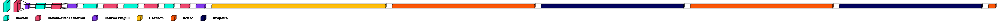

In [ ]:
visualkeras_view(base_model_2)

In [ ]:
# Fit the model
base_model_2_history=base_model_2.fit(X_train, y_train, validation_data=(X_test, y_test) , epochs=50, batch_size=50, verbose=1, callbacks=create_callbacks('base_model_2'))

Epoch 1/50
163/163 [==============================] - ETA: 0s - loss: 6.8761 - accuracy: 0.0061
Epoch 1: saving model to base_model_2_weights.h5
163/163 [==============================] - 325s 2s/step - loss: 6.8761 - accuracy: 0.0061 - val_loss: 5.2500 - val_accuracy: 0.0087 - lr: 0.0010
Epoch 2/50
163/163 [==============================] - ETA: 0s - loss: 5.3210 - accuracy: 0.0135
Epoch 2: saving model to base_model_2_weights.h5
163/163 [==============================] - 310s 2s/step - loss: 5.3210 - accuracy: 0.0135 - val_loss: 5.2265 - val_accuracy: 0.0081 - lr: 0.0010
Epoch 3/50
163/163 [==============================] - ETA: 0s - loss: 5.2126 - accuracy: 0.0125
Epoch 3: saving model to base_model_2_weights.h5
163/163 [==============================] - 315s 2s/step - loss: 5.2126 - accuracy: 0.0125 - val_loss: 5.1348 - val_accuracy: 0.0208 - lr: 0.0010
Epoch 4/50
163/163 [==============================] - ETA: 0s - loss: 5.1705 - accuracy: 0.0163
Epoch 4: saving model to base_mode

In [ ]:
# create an iterator object with write permission - base_model_2.pkl
with open('base_model_2.pkl', 'wb') as files:
    pickle.dump(base_model_2, files)

Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers
......batch_normalization
.........vars
............0
............1
............2
............3
......batch_normalization_1
.........vars
............0
............1
............2
............3
......batch_normalization_2
.........vars
............0
............1
............2
............3
......batch_normalization_3
.........vars
............0
............1
............2
............3
......batch_normalization_4
.........vars
............0
............1
............2
............3
......conv2d
.........vars
............0
............1
......conv2d_1
.........vars
............0
............1
......conv2d_2
.........vars
............0
............1
......conv2d_3
.........vars
............0
............1
......conv2d_4
.........vars
............0
............1
......dense
.........vars
............0
............1
......dense_1
.........vars
............0
............1
......dense_2
.........vars
............0
.

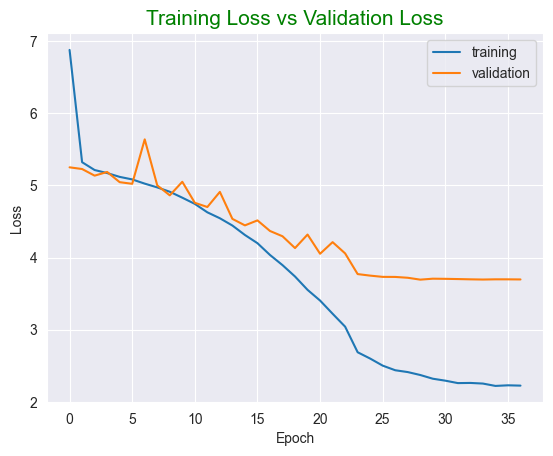

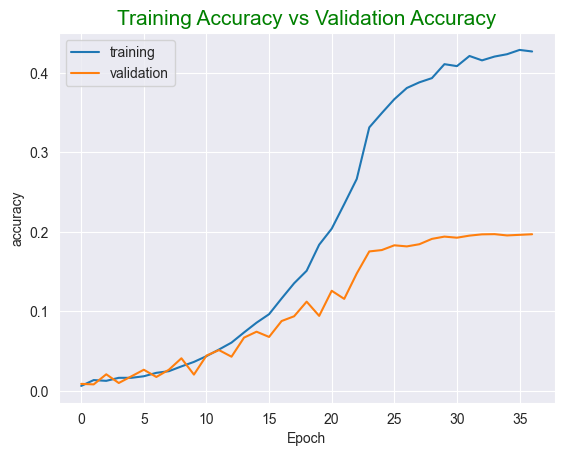

252/252 [==============================] - 62s 243ms/step

Classification Matrix:
               precision    recall  f1-score   support

           0       0.41      0.66      0.50        44
           1       0.00      0.00      0.00        32
           2       0.10      0.14      0.11        43
           3       0.04      0.05      0.05        42
           4       0.08      0.07      0.08        40
           5       0.30      0.36      0.33        44
           6       0.28      0.28      0.28        39
           7       0.06      0.04      0.05        45
           8       0.18      0.17      0.18        41
           9       0.09      0.12      0.10        33
          10       0.38      0.74      0.50        38
          11       0.23      0.19      0.21        36
          12       0.10      0.07      0.09        41
          13       0.05      0.02      0.03        42
          14       0.17      0.09      0.12        43
          15       0.10      0.14      0.12        4

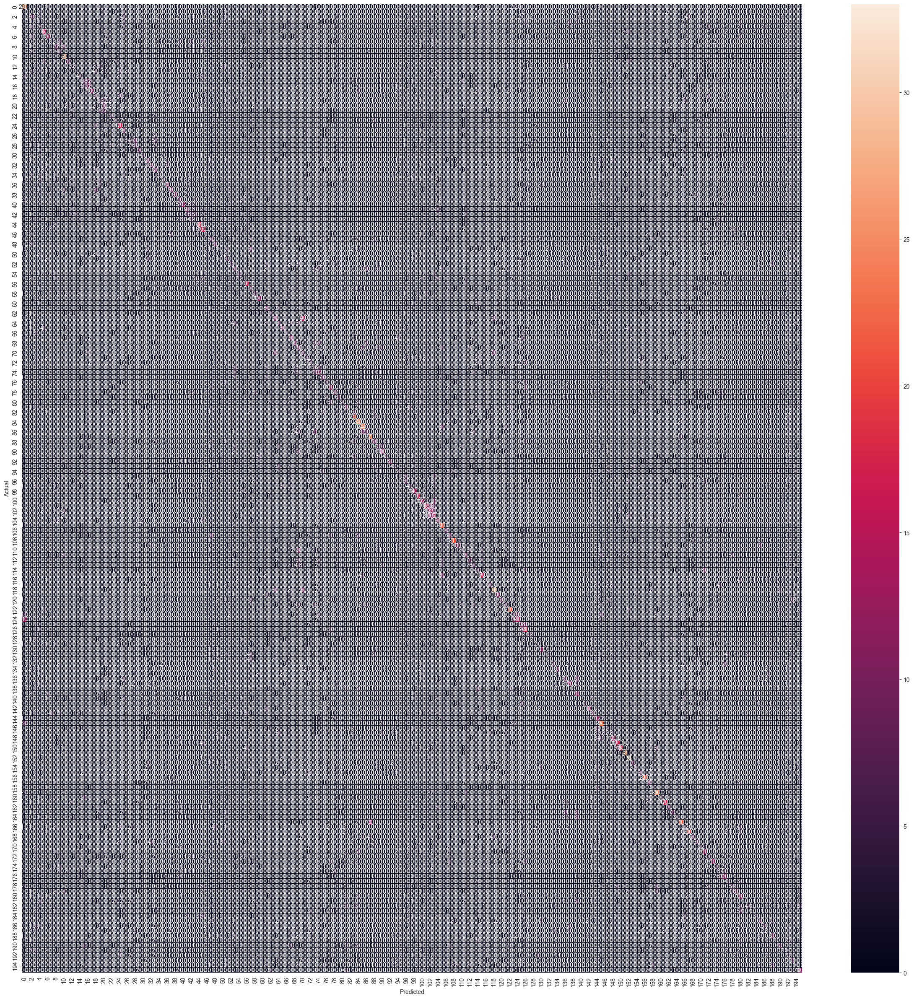

In [ ]:
metric_score(base_model_2_history,base_model_2,50,'base_model_2',model_list)

#### Initializing basic CNN with Architecture as : ResNet50 deep layer

In [ ]:
def res_identity(x, filters):

  x_skip = x # this will be used for addition with the residual block
  f1, f2 = filters

  #first block
  x = Conv2D(f1, kernel_size=(1, 1), strides=(1, 1), padding='valid', kernel_regularizer=l2(0.001))(x)
  x = BatchNormalization()(x)
  x = Activation(activations.relu)(x)

  #second block # bottleneck (but size kept same with padding)
  x = Conv2D(f1, kernel_size=(3, 3), strides=(1, 1), padding='same', kernel_regularizer=l2(0.001))(x)
  x = BatchNormalization()(x)
  x = Activation(activations.relu)(x)

  # third block activation used after adding the input
  x = Conv2D(f2, kernel_size=(1, 1), strides=(1, 1), padding='valid', kernel_regularizer=l2(0.001))(x)
  x = BatchNormalization()(x)
  # x = Activation(activations.relu)(x)

  # add the input
  x = Add()([x, x_skip])
  x = Activation(activations.relu)(x)

  return x

In [ ]:
def res_conv(x, s, filters):
  x_skip = x
  f1, f2 = filters

  # first block
  x = Conv2D(f1, kernel_size=(1, 1), strides=(s, s), padding='valid', kernel_regularizer=l2(0.001))(x)
  # when s = 2 then it is like downsizing the feature map
  x = BatchNormalization()(x)
  x = Activation(activations.relu)(x)

  # second block
  x = Conv2D(f1, kernel_size=(3, 3), strides=(1, 1), padding='same', kernel_regularizer=l2(0.001))(x)
  x = BatchNormalization()(x)
  x = Activation(activations.relu)(x)

  #third block
  x = Conv2D(f2, kernel_size=(1, 1), strides=(1, 1), padding='valid', kernel_regularizer=l2(0.001))(x)
  x = BatchNormalization()(x)

  # shortcut
  x_skip = Conv2D(f2, kernel_size=(1, 1), strides=(s, s), padding='valid', kernel_regularizer=l2(0.001))(x_skip)
  x_skip = BatchNormalization()(x_skip)

  # add
  x = Add()([x, x_skip])
  x = Activation(activations.relu)(x)

  return x

In [ ]:
backend.clear_session()
tf.random.set_seed(random_state)

def resnet50():

  input_im = Input(shape=(224, 224, 3)) # cifar 10 images size
  x = ZeroPadding2D(padding=(3, 3))(input_im)

  # 1st stage
  # here we perform maxpooling, see the figure above

  x = Conv2D(64, kernel_size=(7, 7), strides=(2, 2))(x)
  x = BatchNormalization()(x)
  x = Activation(activations.relu)(x)
  x = MaxPooling2D((3, 3), strides=(2, 2))(x)

  #2nd stage
  # frm here on only conv block and identity block, no pooling

  x = res_conv(x, s=1, filters=(64, 256))
  x = res_identity(x, filters=(64, 256))
  x = res_identity(x, filters=(64, 256))

  # 3rd stage

  x = res_conv(x, s=2, filters=(128, 512))
  x = res_identity(x, filters=(128, 512))
  x = res_identity(x, filters=(128, 512))
  x = res_identity(x, filters=(128, 512))

  # 4th stage

  x = res_conv(x, s=2, filters=(256, 1024))
  x = res_identity(x, filters=(256, 1024))
  x = res_identity(x, filters=(256, 1024))
  x = res_identity(x, filters=(256, 1024))
  x = res_identity(x, filters=(256, 1024))
  x = res_identity(x, filters=(256, 1024))

  # 5th stage

  x = res_conv(x, s=2, filters=(512, 2048))
  x = res_identity(x, filters=(512, 2048))
  x = res_identity(x, filters=(512, 2048))

  # ends with average pooling and dense connection

  x = AveragePooling2D((2, 2), padding='same')(x)

  x = Flatten()(x)
  x = Dense(196, activation='softmax', kernel_initializer='he_normal')(x) #multi-class

  # define the model

  model = Model(inputs=input_im, outputs=x)

  return model

base_model_3=resnet50()
adam = Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.001, amsgrad=False)
base_model_3.compile(optimizer = adam, loss = categorical_crossentropy, metrics = ['accuracy'])

In [ ]:
## Looking into our base model
base_model_3.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_1[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 112, 112, 64  9472        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                              

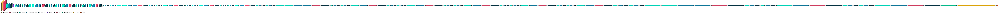

In [ ]:
visualkeras_view(base_model_3)

In [ ]:
# Fit the model
base_model_3_history=base_model_3.fit(X_train, y_train, validation_data=(X_test, y_test) , epochs=20, batch_size=50, verbose=1, callbacks=create_callbacks('base_model_3'))

Epoch 1/20
163/163 [==============================] - ETA: 0s - loss: 25.5179 - accuracy: 0.0068
Epoch 1: saving model to base_model_3_weights.h5
163/163 [==============================] - 2072s 13s/step - loss: 25.5179 - accuracy: 0.0068 - val_loss: 20.2788 - val_accuracy: 0.0051 - lr: 0.0010
Epoch 2/20
163/163 [==============================] - ETA: 0s - loss: 18.1506 - accuracy: 0.0107
Epoch 2: saving model to base_model_3_weights.h5
163/163 [==============================] - 2100s 13s/step - loss: 18.1506 - accuracy: 0.0107 - val_loss: 16.3934 - val_accuracy: 0.0057 - lr: 0.0010
Epoch 3/20
163/163 [==============================] - ETA: 0s - loss: 14.7518 - accuracy: 0.0332 
Epoch 3: saving model to base_model_3_weights.h5
163/163 [==============================] - 3062s 19s/step - loss: 14.7518 - accuracy: 0.0332 - val_loss: 13.7801 - val_accuracy: 0.0175 - lr: 0.0010
Epoch 4/20
163/163 [==============================] - ETA: 0s - loss: 12.3707 - accuracy: 0.0614 
Epoch 4: saving 

In [ ]:
# create an iterator object with write permission - base_model_2.pkl
with open('base_model_3.pkl', 'wb') as files:
    pickle.dump(base_model_3, files)

Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers
......activation
.........vars
......activation_1
.........vars
......activation_10
.........vars
......activation_11
.........vars
......activation_12
.........vars
......activation_13
.........vars
......activation_14
.........vars
......activation_15
.........vars
......activation_16
.........vars
......activation_17
.........vars
......activation_18
.........vars
......activation_19
.........vars
......activation_2
.........vars
......activation_20
.........vars
......activation_21
.........vars
......activation_22
.........vars
......activation_23
.........vars
......activation_24
.........vars
......activation_25
.........vars
......activation_26
.........vars
......activation_27
.........vars
......activation_28
.........vars
......activation_29
.........vars
......activation_3
.........vars
......activation_30
.........vars
......activation_31
.........vars
......activation_32
.........vars
......activa

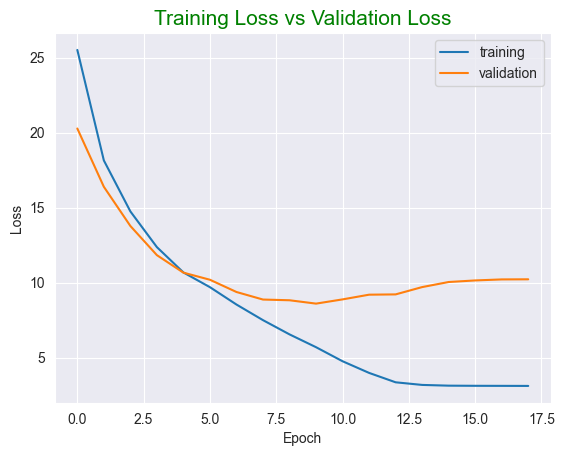

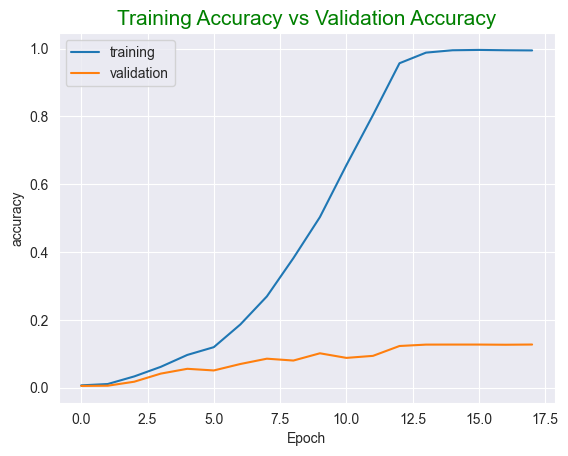

252/252 [==============================] - 527s 2s/step

Classification Matrix:
               precision    recall  f1-score   support

           0       0.23      0.32      0.27        44
           1       0.06      0.03      0.04        32
           2       0.19      0.12      0.14        43
           3       0.06      0.07      0.06        42
           4       0.07      0.05      0.06        40
           5       0.15      0.16      0.15        44
           6       0.25      0.18      0.21        39
           7       0.11      0.09      0.10        45
           8       0.09      0.10      0.09        41
           9       0.05      0.03      0.04        33
          10       0.50      0.42      0.46        38
          11       0.17      0.08      0.11        36
          12       0.07      0.12      0.09        41
          13       0.04      0.07      0.05        42
          14       0.11      0.09      0.10        43
          15       0.09      0.07      0.08        43


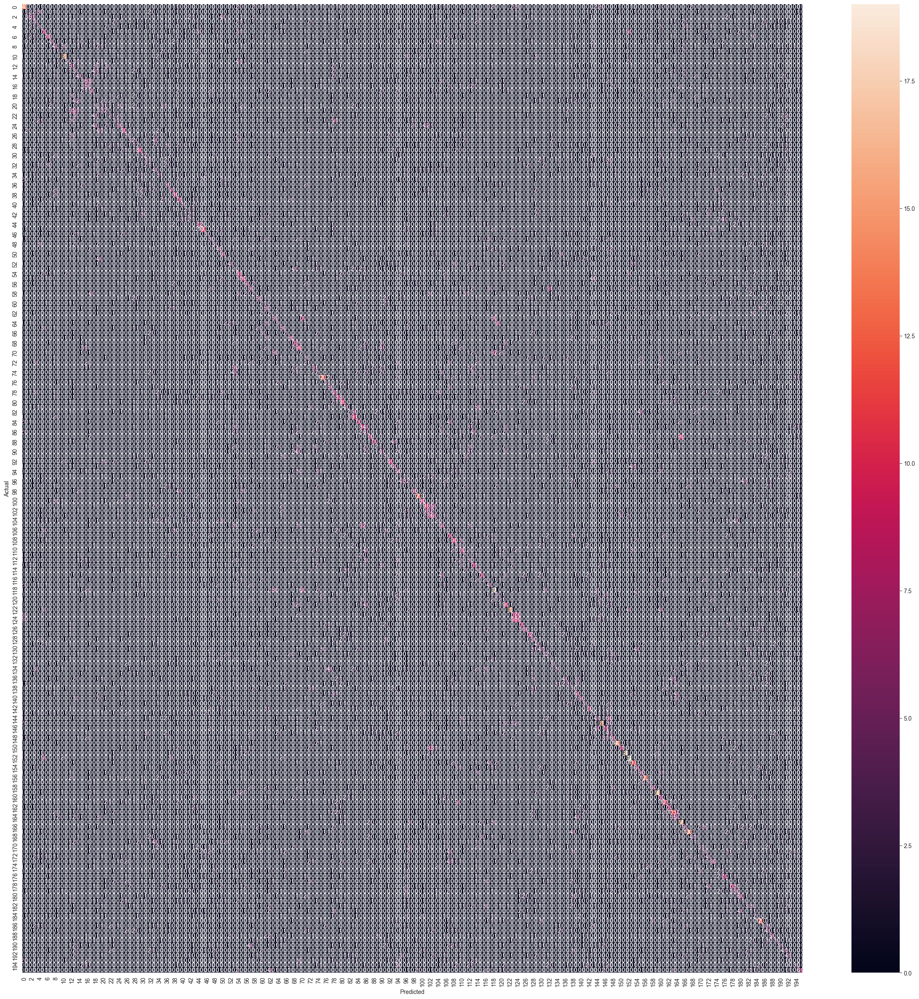

In [ ]:
metric_score(base_model_3_history,base_model_3,50,'base_model_3',model_list)

In [ ]:
pd.DataFrame(model_list,columns=['Model','Train_Loss','Test_Loss','Train_Accuracy','Test_Accuracy','Precision','Recall','F1 Score']).sort_values(by=['Recall','F1 Score'], ascending=False)

,Model,Train_Loss,Test_Loss,Train_Accuracy,Test_Accuracy,Precision,Recall,F1 Score
1,base_model_2,1.634652,3.697144,0.672028,0.196990,0.196990,0.196990,0.196990
2,base_model_3,3.095142,10.225157,0.997667,0.127223,0.127223,0.127223,0.127223
0,base_model_1,0.704541,9.876921,0.840864,0.027111,0.027111,0.027111,0.027111


# Milestone 2

## Step 1: Fine tune the trained basic CNN models to classify the car.

As from above model_list, we get to know base_model_2 did good in old model, so we will be using that model for tuning purpose.

### Image Augmentation

In [ ]:
train_datagen=ImageDataGenerator(preprocessing_function=preprocess_input,
                                rotation_range=20,
                                shear_range = 0.2,
                                width_shift_range=0.2,
                                height_shift_range=0.1,
                                zoom_range=0.2,
                                horizontal_flip=True,
                                vertical_flip=True,
                                brightness_range=[0.1,1.0]
                                )

test_datagen=ImageDataGenerator(preprocessing_function=preprocess_input,
                                rotation_range=20,
                                shear_range = 0.2,
                                width_shift_range=0.2,
                                height_shift_range=0.1,
                                zoom_range=0.2,
                                horizontal_flip=True,
                                vertical_flip=True,
                                brightness_range=[0.1,1.0]
                                )

In [ ]:
train_generator=train_datagen.flow_from_directory(
        directory="Car Images/Train Images Cropped/",
        batch_size=64,
        seed=random_state,
        target_size=(224,224),
        class_mode = 'categorical',
        shuffle=True)


test_generator=test_datagen.flow_from_directory(
    directory="Car Images/Test Images Cropped/",
    batch_size=64,
    seed=random_state,
    target_size=(224,224),
    class_mode = 'categorical',
    shuffle=True)

Found 8144 images belonging to 196 classes.
Found 8041 images belonging to 196 classes.


#### Tuning old scratch model for more accuracy with image augmentation.

In [ ]:
backend.clear_session()
tf.random.set_seed(random_state)

# Initialising CNN classifier
base_model_2_tuned=Sequential()

base_model_2_tuned.add(Conv2D(filters=96,kernel_size=(3,3),input_shape=(224,224,3),activation='relu'))
base_model_2_tuned.add(BatchNormalization())
base_model_2_tuned.add(MaxPool2D(pool_size=(3,3)))

base_model_2_tuned.add(Conv2D(filters=256,kernel_size=(3,3),activation='relu'))
base_model_2_tuned.add(BatchNormalization())
base_model_2_tuned.add(MaxPool2D(pool_size=(3,3)))

base_model_2_tuned.add(Conv2D(filters=384,kernel_size=(3,3),activation='relu'))
base_model_2_tuned.add(BatchNormalization())
base_model_2_tuned.add(MaxPool2D(pool_size=(2,2)))

base_model_2_tuned.add(Conv2D(filters=384,kernel_size=(3,3),activation='relu'))
base_model_2_tuned.add(BatchNormalization())
base_model_2_tuned.add(MaxPool2D(pool_size=(2,2)))

base_model_2_tuned.add(Conv2D(filters=256,kernel_size=(3,3),activation='relu'))
base_model_2_tuned.add(BatchNormalization())
base_model_2_tuned.add(MaxPool2D(pool_size=(2,2)))

# Flattening the layer before fully connected layers
base_model_2_tuned.add(Flatten())

base_model_2_tuned.add(Dense(units=512,activation='relu'))
base_model_2_tuned.add(Dropout(0.2))

base_model_2_tuned.add(Dense(units=512,activation='relu'))
base_model_2_tuned.add(Dropout(0.3))

# The final output layer with 5 neuron to predict the categorical classification
base_model_2_tuned.add(Dense(units=196,activation='softmax'))

adam = Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999, decay=0.001, clipnorm=0.001)
base_model_2_tuned.compile(optimizer = adam, loss = categorical_crossentropy, metrics = ['accuracy'])

base_model_2_tuned.summary()

2023-06-14 16:51:18.817743: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 96)      2688      
                                                                 
 batch_normalization (BatchN  (None, 222, 222, 96)     384       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 96)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 256)       221440    
                                                                 
 batch_normalization_1 (Batc  (None, 72, 72, 256)      1024      
 hNormalization)                                                 
                                                        

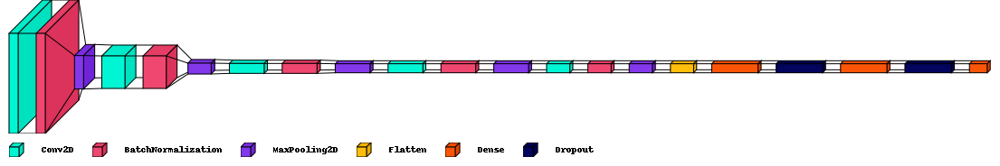

In [ ]:
visualkeras_view(base_model_2_tuned)

In [ ]:
# Fit the model
base_model_2_tuned_history = base_model_2_tuned.fit_generator(train_generator, validation_data=test_generator, epochs=50, verbose=1, callbacks=create_callbacks('base_model_2_tuned'), steps_per_epoch=100, validation_steps=50)

Epoch 1/50
100/100 [==============================] - ETA: 0s - loss: 5.4532 - accuracy: 0.0066
Epoch 1: saving model to base_model_2_tuned_weights.h5
100/100 [==============================] - 1048s 11s/step - loss: 5.4532 - accuracy: 0.0066 - val_loss: 5.3047 - val_accuracy: 0.0053 - lr: 1.0000e-04
Epoch 2/50
100/100 [==============================] - ETA: 0s - loss: 5.3140 - accuracy: 0.0113
Epoch 2: saving model to base_model_2_tuned_weights.h5
100/100 [==============================] - 1064s 11s/step - loss: 5.3140 - accuracy: 0.0113 - val_loss: 5.3069 - val_accuracy: 0.0037 - lr: 1.0000e-04
Epoch 3/50
100/100 [==============================] - ETA: 0s - loss: 5.2629 - accuracy: 0.0107
Epoch 3: saving model to base_model_2_tuned_weights.h5
100/100 [==============================] - 1053s 11s/step - loss: 5.2629 - accuracy: 0.0107 - val_loss: 5.3080 - val_accuracy: 0.0053 - lr: 1.0000e-04
Epoch 4/50
100/100 [==============================] - ETA: 0s - loss: 5.2132 - accuracy: 0.016

In [ ]:
# create an iterator object with write permission - base_model_2.pkl
with open('base_model_2_tuned.pkl', 'wb') as files:
    pickle.dump(base_model_2_tuned, files)

Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers
......batch_normalization
.........vars
............0
............1
............2
............3
......batch_normalization_1
.........vars
............0
............1
............2
............3
......batch_normalization_2
.........vars
............0
............1
............2
............3
......batch_normalization_3
.........vars
............0
............1
............2
............3
......batch_normalization_4
.........vars
............0
............1
............2
............3
......conv2d
.........vars
............0
............1
......conv2d_1
.........vars
............0
............1
......conv2d_2
.........vars
............0
............1
......conv2d_3
.........vars
............0
............1
......conv2d_4
.........vars
............0
............1
......dense
.........vars
............0
............1
......dense_1
.........vars
............0
............1
......dense_2
.........vars
............0
.

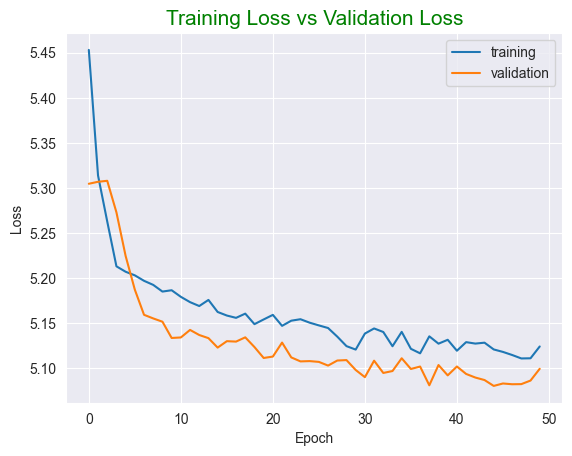

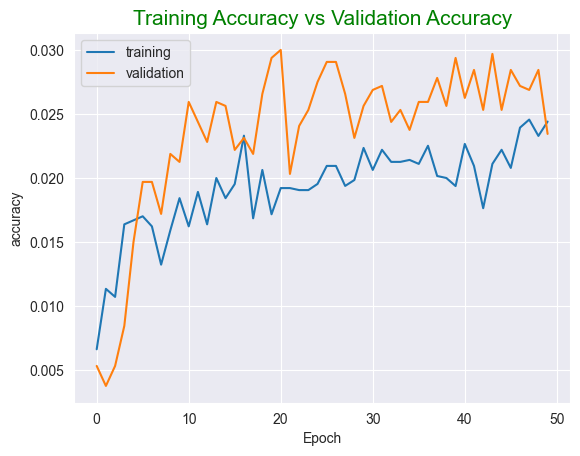

126/126 [==============================] - 225s 2s/step

Classification Matrix:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        44
           1       0.00      0.00      0.00        44
           2       0.00      0.00      0.00        32
           3       0.00      0.00      0.00        43
           4       0.00      0.00      0.00        42
           5       0.00      0.00      0.00        40
           6       0.00      0.00      0.00        39
           7       0.00      0.00      0.00        45
           8       0.00      0.00      0.00        41
           9       0.00      0.00      0.00        33
          10       0.00      0.00      0.00        38
          11       0.00      0.00      0.00        40
          12       0.00      0.00      0.00        42
          13       0.00      0.00      0.00        41
          14       0.00      0.00      0.00        43
          15       0.00      0.00      0.00        36


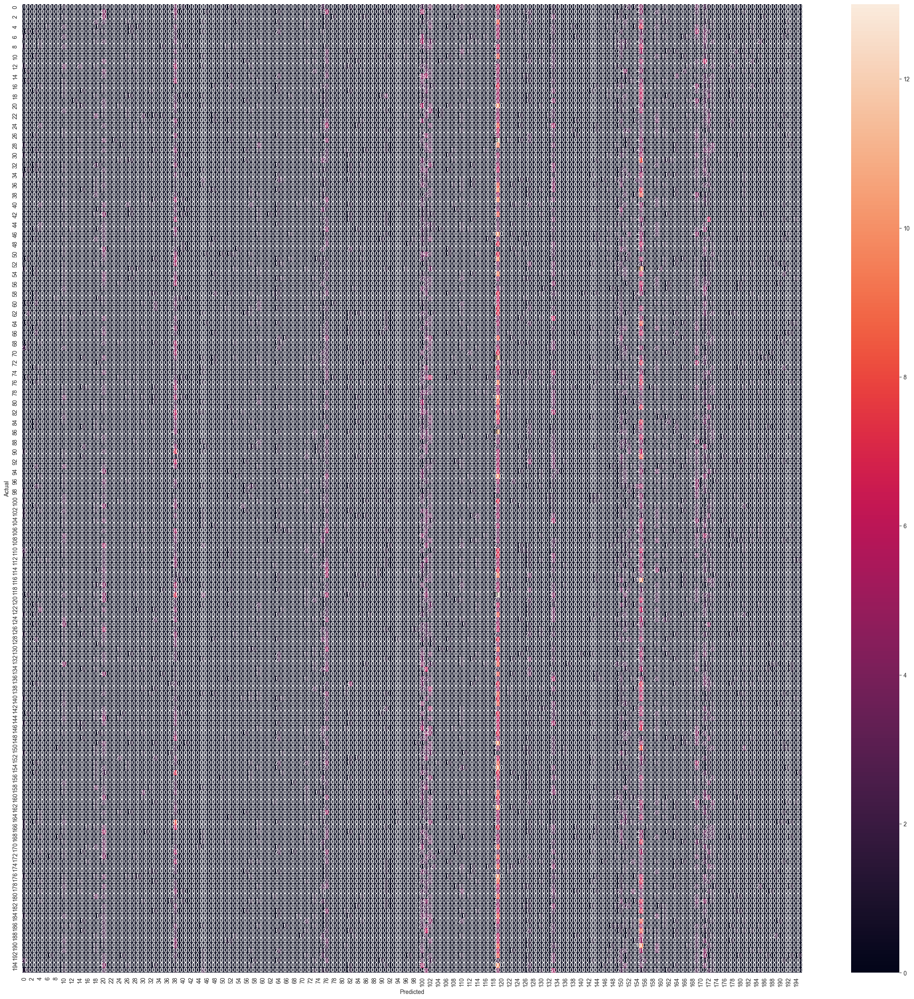

In [ ]:
metric_score(base_model_2_tuned_history,base_model_2_tuned,50,'base_model_2_tuned',model_list, is_image_augmented=True, train_set=train_generator, test_set=test_generator)

#### Initializing MobileNet CNN with Architecture using transfer learning

In [ ]:
backend.clear_session()
tf.random.set_seed(random_state)

base_mobile_net_model = MobileNetV2(input_shape=(224,224,3), include_top=False, weights='imagenet')

x = base_mobile_net_model.output
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = Dropout(.1)(x)
prediction_layer = tf.keras.layers.Dense(196, activation='softmax')(x)

mobile_net_model=Model(inputs=base_mobile_net_model.input,outputs=prediction_layer)

for layer in mobile_net_model.layers[:70]:
    layer.trainable=False
for layer in mobile_net_model.layers[70:]:
    layer.trainable=True

adam = Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999, decay=0.001, clipnorm=0.001)

mobile_net_model.compile(optimizer=adam, loss= CategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

## Looking into our base model
mobile_net_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                             

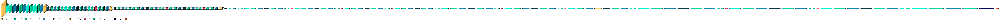

In [ ]:
visualkeras_view(mobile_net_model)

In [ ]:
# Fit the model
mobile_net_model_history=mobile_net_model.fit(train_generator, validation_data=test_generator, epochs=60, verbose=1,  callbacks=create_callbacks('mobile_net_model'))

Epoch 1/60


2023-06-20 16:13:57.473499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


128/128 [==============================] - ETA: 0s - loss: 5.3052 - accuracy: 0.0152

2023-06-20 16:20:31.096848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]



Epoch 1: saving model to mobile_net_model_weights.h5
128/128 [==============================] - 627s 5s/step - loss: 5.3052 - accuracy: 0.0152 - val_loss: 5.2289 - val_accuracy: 0.0219 - lr: 1.0000e-04
Epoch 2/60
128/128 [==============================] - ETA: 0s - loss: 4.6731 - accuracy: 0.0840
Epoch 2: saving model to mobile_net_model_weights.h5
128/128 [==============================] - 613s 5s/step - loss: 4.6731 - accuracy: 0.0840 - val_loss: 4.6484 - val_accuracy: 0.0580 - lr: 1.0000e-04
Epoch 3/60
128/128 [==============================] - ETA: 0s - loss: 3.9227 - accuracy: 0.1891
Epoch 3: saving model to mobile_net_model_weights.h5
128/128 [==============================] - 673s 5s/step - loss: 3.9227 - accuracy: 0.1891 - val_loss: 4.1415 - val_accuracy: 0.1134 - lr: 1.0000e-04
Epoch 4/60
128/128 [==============================] - ETA: 0s - loss: 3.2736 - accuracy: 0.3100
Epoch 4: saving model to mobile_net_model_weights.h5
128/128 [==============================] - 673s 5s/s

In [ ]:
# create an iterator object with write permission - base_model_2.pkl
with open('mobile_net_model.pkl', 'wb') as files:
    pickle.dump(mobile_net_model, files)
mobile_net_model.save('mobile_net_model.h5')

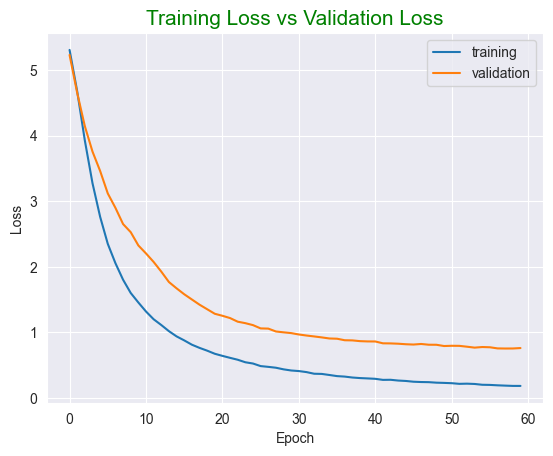

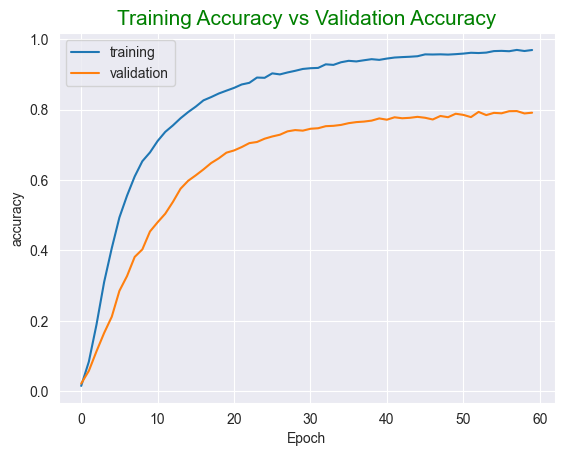

2023-06-21 03:18:05.928186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


128/128 [==============================] - 263s 2s/step - loss: 0.1280 - accuracy: 0.9815


2023-06-21 03:22:29.831084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


126/126 [==============================] - 259s 2s/step - loss: 0.7583 - accuracy: 0.7929


2023-06-21 03:26:50.155536: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


126/126 [==============================] - 260s 2s/step

Classification Matrix:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        44
           1       0.00      0.00      0.00        44
           2       0.00      0.00      0.00        32
           3       0.00      0.00      0.00        43
           4       0.02      0.02      0.02        42
           5       0.00      0.00      0.00        40
           6       0.00      0.00      0.00        39
           7       0.02      0.02      0.02        45
           8       0.00      0.00      0.00        41
           9       0.00      0.00      0.00        33
          10       0.00      0.00      0.00        38
          11       0.00      0.00      0.00        40
          12       0.00      0.00      0.00        42
          13       0.00      0.00      0.00        41
          14       0.00      0.00      0.00        43
          15       0.00      0.00      0.00        36


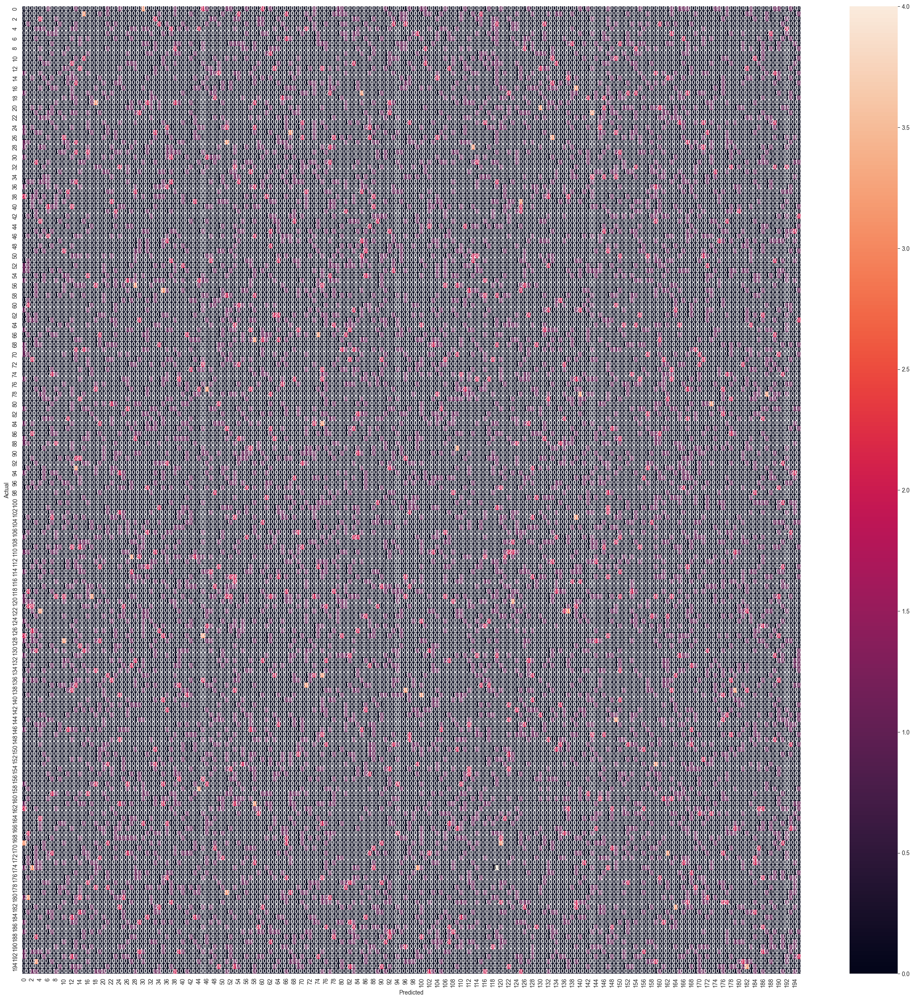

In [ ]:
metric_score(mobile_net_model_history,mobile_net_model,200,'mobile_net_model',model_list, is_image_augmented=True, train_set=train_generator, test_set=test_generator)

# Step 2: Design, train and test RCNN & its hybrids based object detection models to impose the bounding box or mask over the area of interest.

### Using pre-trained models of coco `faster_rcnn_nas_coco_2018_01_28` and examining car dataset, how it shows bbox.

In [ ]:
# Model Loader
def load_model(model_name):
  base_url = 'http://download.tensorflow.org/models/object_detection/'
  model_file = model_name + '.tar.gz'
  model_dir = tf.keras.utils.get_file(
    fname=model_name,
    origin=base_url + model_file,
    untar=True)

  model_dir = pathlib.Path(model_dir)/"saved_model"

  model = tf.saved_model.load(str(model_dir))
  model = model.signatures['serving_default']

  return model

In [ ]:
model_name = 'faster_rcnn_nas_coco_2018_01_28'
detection_model = load_model(model_name)

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


2023-06-23 02:29:46.789343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'unused_control_flow_input_8' with dtype int32
	 [[{{node unused_control_flow_input_8}}]]


In [ ]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Run inference
  output_dict = model(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy()
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)

  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()

  return output_dict

In [ ]:
def show_inference(model, image_path):
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = cv2.resize(cv2.imread(image_path), dsize=(224, 224),interpolation=cv2.INTER_AREA)
  # Actual detection.
  output_dict = run_inference_for_single_image(model, image_np)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)

  display(Image.fromarray(image_np))

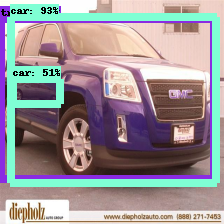

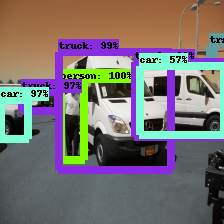

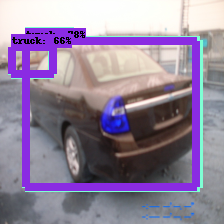

In [ ]:
for idx, row in testing_car_images_df.sample(random_state=random_state,n=3).iterrows():
    show_inference(detection_model, row['Image_Path'])

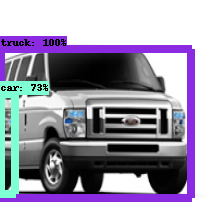

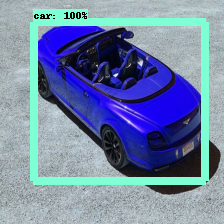

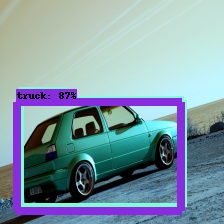

In [ ]:
for idx, row in training_car_images_df.sample(random_state=random_state,n=3).iterrows():
    show_inference(detection_model, row['Image_Path'])

### Object detection models to impose the bounding box

In [ ]:
#For Training data set
file_names=[]
class_ids=[]
bboxes=[]
labels=[]

for i in range(len(annot_train_df)):
    annotations=annot_train_df.iloc[i]

    bboxs_x1=annotations[1]
    bboxs_x2=annotations[2]
    bboxs_x3=annotations[3]
    bboxs_x4=annotations[4]
    bboxes.append((bboxs_x1,bboxs_x2,bboxs_x3,bboxs_x4))

    class_id=annotations[5]
    labels.append('%04d' %(class_id,))

    file_names.append(annotations[0])

    class_ids.append(annotations[5])

## Comparing between file names, coordinates and their labels
print(file_names[:5])
print(bboxes[:5])
print(class_ids[:5])
print(labels[:5])

['00001.jpg', '00002.jpg', '00003.jpg', '00004.jpg', '00005.jpg']
[(39, 116, 569, 375), (36, 116, 868, 587), (85, 109, 601, 381), (621, 393, 1484, 1096), (14, 36, 133, 99)]
[14, 3, 91, 134, 106]
['0014', '0003', '0091', '0134', '0106']


In [ ]:
# function to convert BoundingBoxesOnImage object into DataFrame
def bbs_obj_to_df(bbs_object):
    # convert BoundingBoxesOnImage object into array
    bbs_array = bbs_object.to_xyxy_array()
    # convert array into a DataFrame ['xmin', 'ymin', 'xmax', 'ymax'] columns
    df_bbs = pd.DataFrame(bbs_array, columns=['xmin', 'ymin', 'xmax', 'ymax'])
    return df_bbs

In [ ]:
def display_img_bb(g,df):
    x1=df['xmin'][g]
    y1=df['ymin'][g]
    x2=df['xmax'][g]
    y2=df['ymax'][g]

    print('Class Name ->', df['class'][g])

    unscaled=cv2.imread(df['filename'][g])[...,::-1]
    fig, ax=plt.subplots(1)
    ax.imshow(unscaled)
    rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='orange', facecolor='none')
    ax.add_patch(rect)
    plt.grid(None)
    plt.axis('off')
    plt.show()

In [ ]:
# Remove quotes in the front to generate augmentation images and corresponding bounding boxes dataframe

# This setup of augmentation parameters will pick two of four given augmenters and apply them in random order
augmentor = iaa.SomeOf(2, [
    iaa.Affine(scale=(0.5, 1.5)),
    iaa.Affine(rotate=(-60, 60)),
    iaa.Affine(translate_percent={"x": (-0.3, 0.3), "y": (-0.3, 0.3)}),
    iaa.Fliplr(1),
    iaa.Multiply((0.5, 1.5)),
    iaa.GaussianBlur(sigma=(1.0, 3.0)),
    iaa.AdditiveGaussianNoise(scale=(0.03*255, 0.05*255))
])

aug_images_path='Car Images/Train Images Aug/'
image_prefix='train_aug_'
aug_bbs_xy = pd.DataFrame(columns=['filename', 'xmin', 'ymin', 'xmax', 'ymax','class'])

train_folder=glob.glob('Car Images/Train Images/*/*')
for j in range(len(train_folder)):
    index=file_names.index(train_folder[j].split('/')[-1])

    (x1,y1,x2,y2)=bboxes[index]
    tmp_array=[x1,y1,x2,y2]
    df = pd.DataFrame([tmp_array])
    df.columns =['col1','col2','col3','col4']
    bb_array=df.values
    filename=train_folder[j].split('/')[-1]
    classname=train_folder[j].split('/')[-2]
    file_path=os.path.join('Car Images/Train Images/'+classname+'/'+filename)
    image = imageio.imread(file_path)
    bbs = BoundingBoxesOnImage.from_xyxy_array(bb_array, shape=image.shape)
    image_aug, bbs_aug = augmentor(image=image, bounding_boxes=bbs)
    bbs_aug = bbs_aug.remove_out_of_image()
    bbs_aug = bbs_aug.clip_out_of_image()

    if re.findall('Image...', str(bbs_aug)) == ['Image([]']:
        pass
    else:
        imageio.imwrite(aug_images_path+image_prefix+filename, image_aug)
        bbs_df = bbs_obj_to_df(bbs_aug)
        im_df = pd.DataFrame(columns=['filename', 'xmin', 'ymin', 'xmax', 'ymax','class'])
        im_df = im_df.append({'filename' : aug_images_path+image_prefix+filename, 'xmin' : bbs_df.iloc[0]['xmin'], 'ymin' : bbs_df.iloc[0]['ymin'],'xmax' : bbs_df.iloc[0]['xmax'],'ymax' : bbs_df.iloc[0]['ymax'], 'class' : classname}  ,ignore_index = True)
        aug_bbs_xy = pd.concat([aug_bbs_xy, im_df])

aug_bbs_xy = aug_bbs_xy.reset_index()
aug_bbs_xy = aug_bbs_xy.drop(['index'], axis=1)

aug_bbs_xy.to_csv('aug_bbs_xy.csv', index=False )
aug_bbs_xy.head(5)

,filename,xmin,ymin,xmax,ymax,class
0,Car Images/Train Images Aug/train_aug_06796.jpg,34.233593,102.707161,338.233582,307.707153,Dodge Dakota Crew Cab 2010
1,Car Images/Train Images Aug/train_aug_04157.jpg,1.069397,16.964672,250.856064,174.215591,Dodge Dakota Crew Cab 2010
2,Car Images/Train Images Aug/train_aug_00682.jpg,11.000000,15.000000,297.000000,201.000000,Dodge Dakota Crew Cab 2010
3,Car Images/Train Images Aug/train_aug_07660.jpg,245.173126,0.000000,1024.000000,534.452820,Dodge Dakota Crew Cab 2010
4,Car Images/Train Images Aug/train_aug_00483.jpg,0.000000,0.000000,588.537964,304.321442,Dodge Dakota Crew Cab 2010


Class Name -> Dodge Dakota Crew Cab 2010


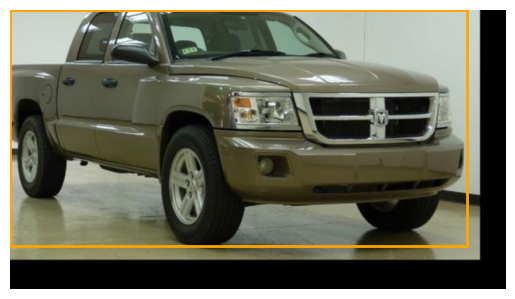

Class Name -> Dodge Dakota Crew Cab 2010


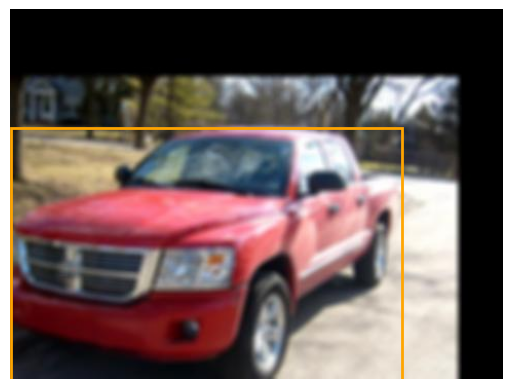

In [ ]:
# Displaying images and bounding boxes
display_img_bb(4,aug_bbs_xy)
display_img_bb(11,aug_bbs_xy)

In [ ]:
train_images_df=annot_train_car_images_df.copy(deep=True)
train_images_df.drop(columns=['Image_Name','Image_Class'],inplace=True)
train_images_df.columns=['filename','class','xmin','ymin','xmax','ymax']
train_images_df.head()

,filename,class,xmin,ymin,xmax,ymax
0,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,57,88,361,293
1,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,10,20,256,171
2,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,11,15,297,201
3,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,68,122,980,690
4,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,18,26,623,342


In [ ]:
aug_bbs_xy.shape,train_images_df.shape

((8144, 6), (8144, 6))

In [ ]:
## merging two datafames into one common dataframe where we can get all the details about both org images and arg images
final_train_df=  pd.DataFrame(columns=['filename', 'xmin', 'ymin', 'xmax', 'ymax','class'])
final_train_df = pd.concat([train_images_df, aug_bbs_xy], ignore_index=True)
final_train_df.reset_index(inplace=True)
final_train_df.drop(['index'], axis=1, inplace=True)

final_train_df.to_csv('final_train_df.csv', index=False )
final_train_df.head(5)

,filename,class,xmin,ymin,xmax,ymax
0,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,57.0,88.0,361.0,293.0
1,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,10.0,20.0,256.0,171.0
2,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,11.0,15.0,297.0,201.0
3,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,68.0,122.0,980.0,690.0
4,Car Images/Train Images/Dodge Dakota Crew Cab ...,Dodge Dakota Crew Cab 2010,18.0,26.0,623.0,342.0


In [ ]:
# After merging original and augmented dataset
final_train_df.shape

(16288, 6)

Class Name -> Aston Martin V8 Vantage Convertible 2012


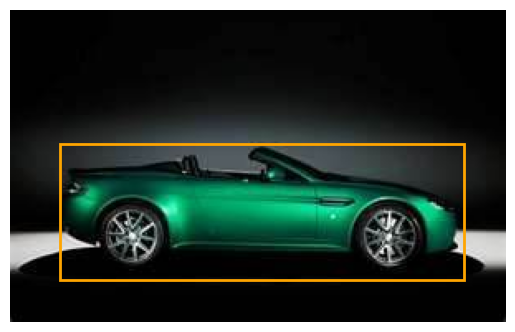

Class Name -> Chrysler Town and Country Minivan 2012


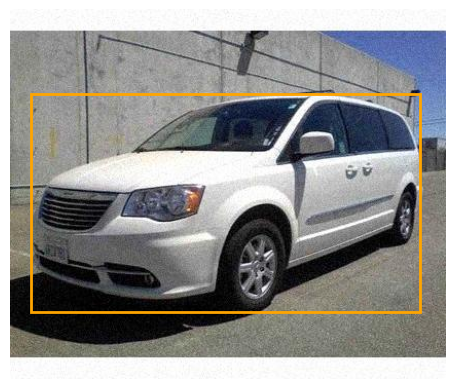

In [ ]:
# Displaying images and bounding boxes
display_img_bb(1114,final_train_df)
display_img_bb(11111,final_train_df)

In [ ]:
# Scaling final dataset
trainImagePaths=[]
trainBboxes =[]
trainLabels=[]

trainData= np.zeros((len(final_train_df), 224, 224,3), dtype=np.float32)

for i in range(len(final_train_df)):
    row_obj=final_train_df.iloc[i]
    fname=row_obj[0]
    label=row_obj[1]
    bbx1=row_obj[2]
    bbx2=row_obj[3]
    bbx3=row_obj[4]
    bbx4=row_obj[5]

    #appending values to list
    trainImagePaths.append(fname)
    trainLabels.append(label)

    ## operations on images and bounding boxes
    org_img=cv2.imread(fname)
    (h,w)=org_img.shape[:2]
    startX=float(bbx1)/w
    startY=float(bbx2)/h
    endX=float(bbx3)/w
    endY=float(bbx4)/h
    trainBboxes.append((startX,startY,endX,endY))

    trainData[i]=cv2.resize(org_img, dsize=(224, 224), interpolation=cv2.INTER_AREA)


trainData=np.array(trainData, dtype='float32')/255.0
trainLabels=np.array(trainLabels)
trainBboxes=np.array(trainBboxes, dtype='float32')
trainImagePaths=np.array(trainImagePaths)

np.save('Car Images/trainData.npy', trainData)
np.save('Car Images/trainLabels.npy', trainLabels)
np.save('Car Images/trainBboxes.npy', trainBboxes)
np.save('Car Images/trainImagePaths.npy', trainImagePaths)

In [ ]:
## performing one hot encoding on the labels
trainLabels_lb=lb.fit_transform(trainLabels)

In [ ]:
trainData.shape, trainBboxes.shape, trainLabels_lb.shape

((16288, 224, 224, 3), (16288, 4), (16288, 196))

In [ ]:
#For Test data set
test_file_names=[]
test_class_ids=[]
test_bboxes=[]
test_labels=[]

for i in range(len(annot_test_df)):
    annotations=annot_test_df.iloc[i]

    test_bboxs_x1=annotations[1]
    test_bboxs_x2=annotations[2]
    test_bboxs_x3=annotations[3]
    test_bboxs_x4=annotations[4]
    test_bboxes.append((test_bboxs_x1,test_bboxs_x2,test_bboxs_x3,test_bboxs_x4))

    test_class_id=annotations[5]
    test_labels.append('%04d' %(test_class_id,))

    test_file_names.append(annotations[0])

    test_class_ids.append(annotations[5])

## Comparing between file names, coordinates and their labels
print(test_file_names[:5])
print(test_bboxes[:5])
print(test_class_ids[:5])
print(test_labels[:5])

['00001.jpg', '00002.jpg', '00003.jpg', '00004.jpg', '00005.jpg']
[(30, 52, 246, 147), (100, 19, 576, 203), (51, 105, 968, 659), (67, 84, 581, 407), (140, 151, 593, 339)]
[181, 103, 145, 187, 185]
['0181', '0103', '0145', '0187', '0185']


In [ ]:
annot_test_df.shape

(8041, 6)

In [ ]:
# Scaling test dataset
testImagePaths=[]
testBboxes =[]
testLabels=[]

testData= np.zeros((len(annot_test_df), 224, 224,3), dtype=np.float32)

test_folder=glob.glob('Car Images/Test Images/*/*')
for j in range(len(test_folder)):
    index=test_file_names.index(test_folder[j].split('/')[-1])

    (x1,y1,x2,y2)=test_bboxes[index]
    test_filename=test_folder[j].split('/')[-1]
    classname=test_folder[j].split('/')[-2]
    test_file_path=os.path.join('Car Images/Test Images/'+classname+'/'+test_filename)

    testImagePaths.append(test_file_path)
    testLabels.append(classname)

    # Resizing the coordinates
    originalImage=cv2.imread(test_file_path)
    (h,w)=originalImage.shape[:2]
    startX=float(x1)/w
    startY=float(y1)/h
    endX=float(x2)/w
    endY=float(y2)/h
    testBboxes.append((startX,startY,endX,endY))
    testData[j] = cv2.resize(originalImage, dsize=(224, 224),interpolation=cv2.INTER_AREA)

testData=np.array(testData, dtype='float32')/255.0
testLabels=np.array(testLabels)
testBboxes=np.array(testBboxes, dtype='float32')
testImagePaths=np.array(testImagePaths)

np.save('Car Images/testData.npy', testData)
np.save('Car Images/testLabels.npy', testLabels)
np.save('Car Images/testBboxes.npy', testBboxes)
np.save('Car Images/testImagePaths.npy', testImagePaths)

In [ ]:
## performing one hot encoding on the labels
testLabels_lb=lb.fit_transform(testLabels)

In [ ]:
testData.shape, testBboxes.shape, testLabels_lb.shape

((8041, 224, 224, 3), (8041, 4), (8041, 196))

In [ ]:
backend.clear_session()
tf.random.set_seed(random_state)

mobile_net_model_new = MobileNetV2(input_shape=(224,224,3), include_top=False, weights='imagenet')

for layer in mobile_net_model_new.layers[:70]:
    layer.trainable=False
for layer in mobile_net_model_new.layers[70:]:
    layer.trainable=True

flatten=Flatten()(mobile_net_model_new.output)

In [ ]:
# construct a fully-connected layer header to output the predicted bounding box coordinates
bboxHead = Dense(128, activation="relu")(flatten)
bboxHead = Dense(64, activation="relu")(bboxHead)
bboxHead = Dense(32, activation="relu")(bboxHead)
bboxHead = Dense(4, activation="sigmoid",name="bounding_box")(bboxHead)

# construct a second fully-connected layer head, this one to predict the class label
softmaxHead = Dense(512, activation="relu")(flatten)
softmaxHead = Dense(256, activation="relu")(softmaxHead)
softmaxHead = Dense(128, activation="relu")(softmaxHead)
softmaxHead = Dense(196, activation="softmax",name="class_label")(softmaxHead)

In [ ]:
# construct a dictionary for our target training outputs
trainTargets = {
	"class_label": trainLabels_lb,
	"bounding_box": trainBboxes
}

# construct a second dictionary, this one for our target testing outputs
testTargets = {
	"class_label": testLabels_lb,
	"bounding_box": testBboxes
}

In [ ]:
# define a dictionary to set the loss methods -- categorical cross-entropy for the class label head and mean absolute error for the bounding box head
losses = {
	"class_label": categorical_crossentropy,
	"bounding_box": "mean_squared_error",
}

# define a dictionary that specifies the weights per loss (both the  class label and bounding box outputs will receive equal weight)
lossWeights = {
	"class_label": 1.0,
	"bounding_box": 1.0
}

In [ ]:
# put together our model which accept an input image and then output bounding box coordinates and a class label
model_mobile_net_bb = Model(inputs=mobile_net_model_new.input, outputs=(bboxHead, softmaxHead))

adam = Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, decay=0.001)

model_mobile_net_bb.compile(optimizer=adam, loss= losses, metrics=['accuracy'],loss_weights=lossWeights)

## Looking into our base model
model_mobile_net_bb.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

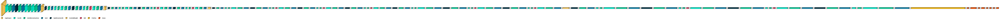

In [ ]:
visualkeras_view(model_mobile_net_bb)

In [ ]:
# Fit the model
model_mobile_net_bb_history = model_mobile_net_bb.fit(trainData, trainTargets, validation_data=(testData, testTargets), epochs=50, batch_size=50, verbose=1, callbacks=create_callbacks('model_mobile_net_bb'))

Epoch 1/50
326/326 [==============================] - ETA: 0s - loss: 4.2079 - bounding_box_loss: 0.0101 - class_label_loss: 4.1978 - bounding_box_accuracy: 0.7175 - class_label_accuracy: 0.1092
Epoch 1: saving model to model_mobile_net_bb_weights.h5
326/326 [==============================] - 889s 3s/step - loss: 4.2079 - bounding_box_loss: 0.0101 - class_label_loss: 4.1978 - bounding_box_accuracy: 0.7175 - class_label_accuracy: 0.1092 - val_loss: 6.7061 - val_bounding_box_loss: 0.0273 - val_class_label_loss: 6.6788 - val_bounding_box_accuracy: 0.6978 - val_class_label_accuracy: 0.0199 - lr: 0.0010
Epoch 2/50
326/326 [==============================] - ETA: 0s - loss: 2.5983 - bounding_box_loss: 0.0050 - class_label_loss: 2.5933 - bounding_box_accuracy: 0.7860 - class_label_accuracy: 0.3262
Epoch 2: saving model to model_mobile_net_bb_weights.h5
326/326 [==============================] - 2563s 8s/step - loss: 2.5983 - bounding_box_loss: 0.0050 - class_label_loss: 2.5933 - bounding_box_a

In [ ]:
# create an iterator object with write permission - model_mobile_net_bb.pkl
with open('model_mobile_net_bb.pkl', 'wb') as files:
    pickle.dump(model_mobile_net_bb, files)
model_mobile_net_bb.save('model_mobile_net_bb.h5')

# serialize the label binarizer to disk
with open('lb.pkl', 'wb') as files:
    pickle.dump(lb, files)

# serialize the label binarizer to disk
with open('model_mobile_net_bb_history.pkl', 'wb') as files:
    pickle.dump(model_mobile_net_bb_history, files)

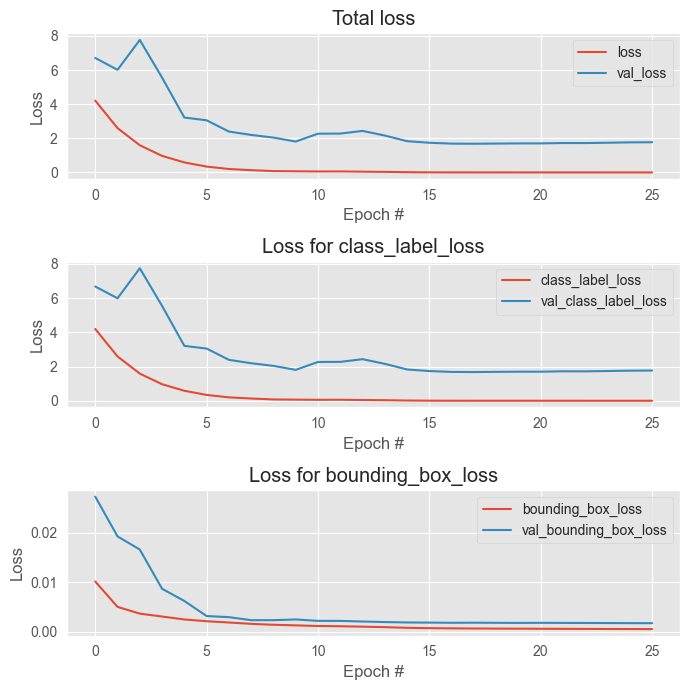

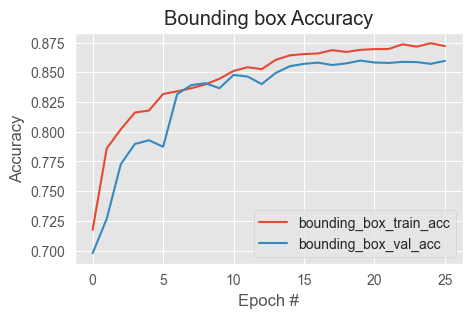

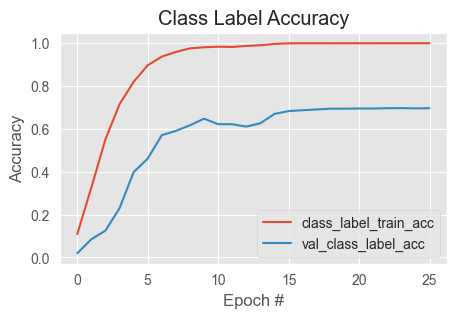

In [ ]:
## Drawing plots
# plot the total loss, label loss, and bounding box loss
lossNames = ["loss", "class_label_loss", "bounding_box_loss"]
N = np.arange(0, 26)
plt.style.use("ggplot")
(fig, ax) = plt.subplots(3, 1, figsize=(7, 7))

# loop over the loss names
for (i, l) in enumerate(lossNames):
	# plot the loss for both the training and validation data
	title = "Loss for {}".format(l) if l != "loss" else "Total loss"
	ax[i].set_title(title)
	ax[i].set_xlabel("Epoch #")
	ax[i].set_ylabel("Loss")
	ax[i].plot(N, model_mobile_net_bb_history.history[l], label=l)
	ax[i].plot(N, model_mobile_net_bb_history.history["val_" + l], label="val_" + l)
	ax[i].legend()
fig.tight_layout()

plt.style.use("ggplot")
plt.figure(figsize=(5,3))
plt.plot(N, model_mobile_net_bb_history.history["bounding_box_accuracy"],
	label="bounding_box_train_acc")
plt.plot(N, model_mobile_net_bb_history.history["val_bounding_box_accuracy"],
	label="bounding_box_val_acc")
plt.title("Bounding box Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Accuracy")
plt.legend(loc="lower right")


plt.style.use("ggplot")
plt.figure(figsize=(5,3))
plt.plot(N, model_mobile_net_bb_history.history["class_label_accuracy"],
	label="class_label_train_acc")
plt.plot(N, model_mobile_net_bb_history.history["val_class_label_accuracy"],
	label="val_class_label_acc")
plt.title("Class Label Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Accuracy")
plt.legend(loc="lower right")
plt.show()

In [ ]:
def predict(image_path, model):
    img1 = load_img(image_path, target_size=(224, 224))
    img1 = img_to_array(img1) / 255.0
    img1 = np.expand_dims(img1, axis=0)

    car_name=image_path.split('/')[-2]

    (box_pred, label_pred) = model.predict(img1)
    (x1, y1, x2, y2) = box_pred[0]

    i = np.argmax(label_pred, axis=1)
    label = lb.classes_[i][0]

    image2 = cv2.imread(image_path)
    (h, w) = image2.shape[:2]

    # scale the predicted bounding box coordinates based on the image dimensions
    x1 = int(x1 * w)
    y1 = int(y1 * h)
    x2 = int(x2 * w)
    y2 = int(y2 * h)

    # draw the predicted bounding box and class label on the image
    y = y1 - 10 if y1 - 10 > 10 else y1 + 10

    cv2.rectangle(image2, (x1, y1), (x2, y2), (17, 32, 80), 2)

    cv2.putText(image2, label, (x1, y), cv2.FONT_HERSHEY_TRIPLEX, 0.45, (17, 32, 80), 1)

    top5_predictions = np.argsort(label_pred, axis=1)[:,-5:]

    names = []
    for i in range(1,6):
      names += [lb.classes_[top5_predictions[0][-i]]]

    probs = np.sort(label_pred)[:,-5:][0][::-1]

    # Plotting test image and predicted probabilites
    f, ax = plt.subplots(2,figsize = (6,10))

    ax[0].imshow(image2[...,::-1]),ax[0].axis('off'),ax[0].grid(None)
    ax[0].set_title(car_name)

    y_names = np.arange(len(names))
    ax[1].barh(y_names, probs/probs.sum(), color='orange')
    ax[1].set_yticks(y_names)
    ax[1].set_yticklabels(names)
    ax[1].invert_yaxis()
    ax[1].set_title('Top 5 Predictions')

    plt.show()

1/1 [==============================] - 0s 57ms/step


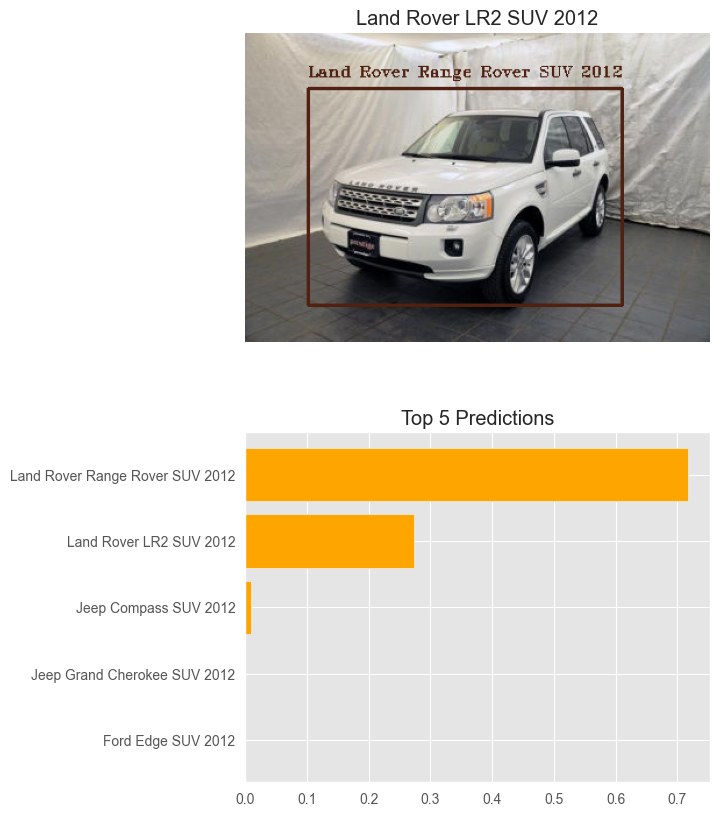

In [ ]:
predict('Car Images/Test Images/Land Rover LR2 SUV 2012/01116.jpg', model_mobile_net_bb)

1/1 [==============================] - 0s 87ms/step


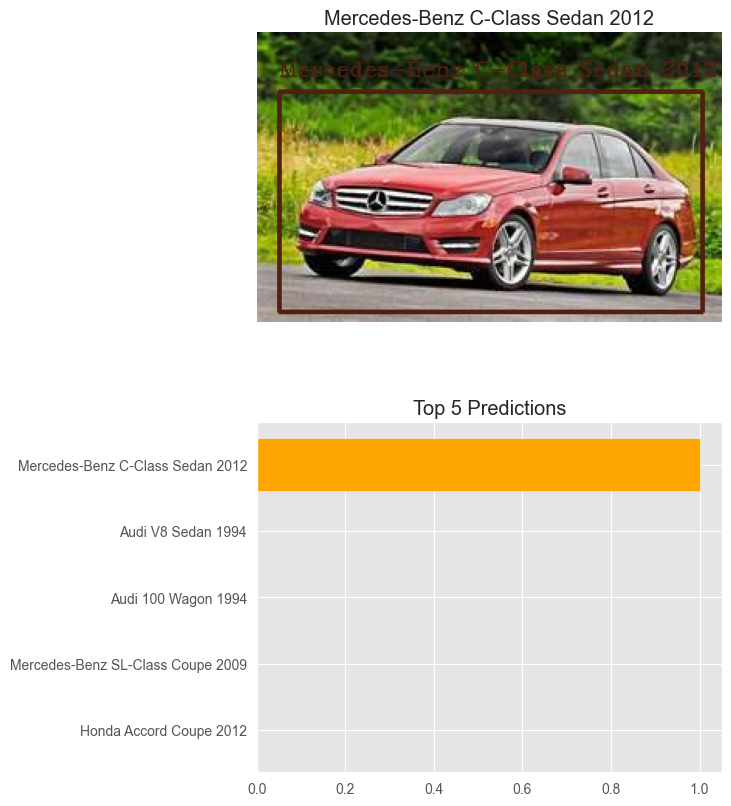

In [ ]:
predict('Car Images/Test Images/Mercedes-Benz C-Class Sedan 2012/01127.jpg', model_mobile_net_bb)